**Projet 7 Implémentez un modèle de scoring**  
**Mission1 Élaborez le modèle de scoring**

* last update:  2024-07-05

Analyse exploratoire, préparation des données et feature enginering réalisés à partir des codes Kaggle de WILL KOEHRSEN et AGUIAR     
https://www.kaggle.com/code/willkoehrsen/start-here-a-gentle-introduction/notebook#Just-for-Fun:-Light-Gradient-Boosting-Machine  
https://www.kaggle.com/code/jsaguiar/lightgbm-with-simple-features/script  

In [234]:
import sys
sys.executable

'C:\\Users\\gwenn\\anaconda3\\python.exe'

je travaille sur mon environnement base

In [236]:
#pip install mlflow

In [237]:
# Importation de MLflow pour la gestion des cycles de vie des modèles ML
import mlflow

**Utiliser MLFlow pour le tracking d'expérimentations**   
https://mlflow.org/docs/latest/getting-started/intro-quickstart/index.html

Démarrer le serveur MLflow dans un terminal :   
mlflow server --backend-store-uri sqlite:///mlflow.db --default-artifact-root ./mlruns  

Démarrer l'UI MLflow dans un terminal :     
mlflow ui --backend-store-uri sqlite:///mlflow.db --default-artifact-root ./mlruns

In [241]:
# Configuration de l'URI de suivi MLflow
# Cette URI pointe vers l'instance MLflow en cours d'exécution, accessible localement. adresse 127.0.0.1 et port 5000.
# Elle permet d'enregistrer les métriques, paramètres, modèles, etc.

mlflow.set_tracking_uri('http://127.0.0.1:5000')

**Credit Default Risk**   
The objective is to use historical loan application data to predict whether or not an applicant will be able to repay a loan. This is a standard supervised classification task:  
Supervised : The labels are included in the training data and the goal is to train a model to learn to predict the labels from the features  
Classification : The label is a binary variable, 0 (will repay loan on time), 1 (will have difficulty repaying loan)  


# Data

The data is provided by [Home Credit](http://www.homecredit.net/about-us.aspx), a service dedicated to provided lines of credit (loans) to the unbanked population. Predicting whether or not a client will repay a loan or have difficulty is a critical business need, and Home Credit is hosting this competition on Kaggle to see what sort of models the machine learning community can develop to help them in this task. 

There are 7 different sources of data:

* application_train/application_test: the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature `SK_ID_CURR`. The training application data comes with the `TARGET` indicating 0: the loan was repaid or 1: the loan was not repaid. 
* bureau: data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* bureau_balance: monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length. 
* previous_application: previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature `SK_ID_PREV`. 
* POS_CASH_BALANCE: monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* installments_payment: payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment. 

This diagram shows how all of the data is related:

![image](https://storage.googleapis.com/kaggle-media/competitions/home-credit/home_credit.png)

Moreover, we are provided with the definitions of all the columns (in `HomeCredit_columns_description.csv`) and an example of the expected submission file. 

In this notebook, we will stick to using only the main application training and testing data. Although if we want to have any hope of seriously competing, we need to use all the data, for now we will stick to one file which should be more manageable. This will let us establish a baseline that we can then improve upon. With these projects, it's best to build up an understanding of the problem a little at a time rather than diving all the way in and getting completely lost! 

## Metric: ROC AUC

Once we have a grasp of the data (reading through the [column descriptions](https://www.kaggle.com/c/home-credit-default-risk/data) helps immensely), we need to understand the metric by which our submission is judged. In this case, it is a common classification metric known as the [Receiver Operating Characteristic Area Under the Curve (ROC AUC, also sometimes called AUROC)](https://stats.stackexchange.com/questions/132777/what-does-auc-stand-for-and-what-is-it).

The ROC AUC may sound intimidating, but it is relatively straightforward once you can get your head around the two individual concepts. The [Reciever Operating Characteristic (ROC) curve](https://en.wikipedia.org/wiki/Receiver_operating_characteristic) graphs the true positive rate versus the false positive rate:

![image](http://www.statisticshowto.com/wp-content/uploads/2016/08/ROC-curve.png)

A single line on the graph indicates the curve for a single model, and movement along a line indicates changing the threshold used for classifying a positive instance. The threshold starts at 0 in the upper right to and goes to 1 in the lower left. A curve that is to the left and above another curve indicates a better model. For example, the blue model is better than the red model, which is better than the black diagonal line which indicates a naive random guessing model. 

The [Area Under the Curve (AUC)](http://gim.unmc.edu/dxtests/roc3.htm) explains itself by its name! It is simply the area under the ROC curve. (This is the integral of the curve.) This metric is between 0 and 1 with a better model scoring higher. A model that simply guesses at random will have an ROC AUC of 0.5.

When we measure a classifier according to the ROC AUC, we do not generation 0 or 1 predictions, but rather a probability between 0 and 1. This may be confusing because we usually like to think in terms of accuracy, but when we get into problems with inbalanced classes (we will see this is the case), accuracy is not the best metric. For example, if I wanted to build a model that could detect terrorists with 99.9999% accuracy, I would simply make a model that predicted every single person was not a terrorist. Clearly, this would not be effective (the recall would be zero) and we use more advanced metrics such as ROC AUC or the [F1 score](https://en.wikipedia.org/wiki/F1_score) to more accurately reflect the performance of a classifier. A model with a high ROC AUC will also have a high accuracy, but the [ROC AUC is a better representation of model performance.](https://datascience.stackexchange.com/questions/806/advantages-of-auc-vs-standard-accuracy)

Not that we know the background of the data we are using and the metric to maximize, let's get into exploring the data. In this notebook, as mentioned previously, we will stick to the main data sources and simple models which we can build upon in future work. 

__Follow-up Notebooks__

For those looking to keep working on this problem, I have a series of follow-up notebooks:

* [Manual Feature Engineering Part One](https://www.kaggle.com/willkoehrsen/introduction-to-manual-feature-engineering)
* [Manual Feature Engineering Part Two](https://www.kaggle.com/willkoehrsen/introduction-to-manual-feature-engineering-p2)
* [Introduction to Automated Feature Engineering](https://www.kaggle.com/willkoehrsen/automated-feature-engineering-basics)
* [Advanced Automated Feature Engineering](https://www.kaggle.com/willkoehrsen/tuning-automated-feature-engineering-exploratory)
* [Feature Selection](https://www.kaggle.com/willkoehrsen/introduction-to-feature-selection)
* [Intro to Model Tuning: Grid and Random Search](https://www.kaggle.com/willkoehrsen/intro-to-model-tuning-grid-and-random-search)
* [Automated Model Tuning](https://www.kaggle.com/willkoehrsen/automated-model-tuning)
* [Model Tuning Results](https://www.kaggle.com/willkoehrsen/model-tuning-results-random-vs-bayesian-opt/notebook)


I'll add more notebooks as I finish them! Thanks for all the comments! 

## Imports

We are using a typical data science stack: `numpy`, `pandas`, `sklearn`, `matplotlib`. 

In [244]:
#pip install lightgbm

In [245]:
# numpy and pandas for data manipulation
import numpy as np
import pandas as pd 
import missingno as msno

# sklearn preprocessing for dealing with categorical variables
from sklearn.preprocessing import LabelEncoder

# File system manangement
import os

import time

# La fonction gc.collect() fait partie du module gc (garbage collection) qui permet de gérer la mémoire allouée pour les objets qui ne sont plus utilisés
import gc

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams

# Machine Learning 
import sklearn
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import cross_val_score, cross_val_predict, cross_validate, learning_curve
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, accuracy_score, precision_score, roc_curve
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import make_scorer

import lightgbm as lgb
from lightgbm import LGBMClassifier

# MLflow Integration
import mlflow
import mlflow.sklearn
from mlflow import sklearn as mlflow_sklearn
from mlflow.models.signature import infer_signature
from mlflow import MlflowClient

# Model Persistence Libraries
import joblib
from joblib import dump, load

# SHAP for Model Interpretation
import shap
shap.initjs()  # Cela initialise le JavaScript nécessaire pour les visualisations shap

In [246]:
# Version Python 
print("Python version")
print(sys.version)

Python version
3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]


In [247]:
# Versions des différences librairies
print("Numpy version:", np.__version__)
print("Pandas version:", pd.__version__)
print("Scikit-learn version:", sklearn.__version__)
print("Joblib version:", joblib.__version__)
print("MLflow version:", mlflow.__version__)
print("Seaborn version:", sns.__version__)

Numpy version: 1.24.4
Pandas version: 2.0.3
Scikit-learn version: 1.3.0
Joblib version: 1.2.0
MLflow version: 2.14.1
Seaborn version: 0.12.2


In [248]:
%matplotlib inline
rcParams['figure.figsize'] = 10, 6
sns.set(style="darkgrid")

In [249]:
# Options d'affichage du résultat sans avoir les points de suspension 
pd.set_option('display.max_rows', None) # Afficher toutes les lignes du DataFrame
pd.set_option('display.max_columns', None) # Afficher toutes les colonnes du DataFrame
pd.set_option('display.max_colwidth', None)  # Afficher toute la largeur de la colonne

## Fonctions

In [251]:
def outliers_z_score(data):
    """
    Recherche des outliers dans les variables numériques à partir du Z-Score.

    Paramètres :
    data (Series ou array-like) : Les données numériques à analyser pour les outliers.

    Retourne :
    Series : Les valeurs identifiées comme outliers.
    """
    data = pd.Series(data).dropna()
    mean = np.mean(data)
    std_dev = np.std(data)
    
    # Calcul des Z-Scores
    z_scores = (data - mean) / std_dev
    
    # Retourne les valeurs qui sont des outliers (Z-Score > 3 ou < -3)
    return data[np.abs(z_scores) > 3]

In [252]:
def apply_log_transform(df, columns_to_transform):
    """
    Applique une transformation logarithmique aux colonnes spécifiées d'un DataFrame
    et crée de nouvelles colonnes avec le suffixe '_log'.

    Parameters:
    df (pd.DataFrame): Le DataFrame sur lequel appliquer la transformation.
    columns_to_transform (list): Une liste des noms de colonnes à transformer.
    """
    for col in columns_to_transform:
        if col in df.columns:
            log_col_name = col + '_log'
            df[log_col_name] = df[col].apply(lambda x: np.log(x + 1) if x > 0 else np.nan)
        else:
            print(f"Warning: La colonne '{col}' n'existe pas dans le DataFrame.")

In [253]:
def missing_values(df):
        '''
        Fonction qui calcule les valeurs manquantes d'un dataset
        
        '''
        # Nombre total de valeurs manquantes
        mis_val = df.isna().sum()
        
        # Pourcentage de valeurs manquantes
        mis_val_percent =(df.isnull().sum() / len(df))*100
        
        # Construction d'un tableau avec les résultats
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Renommage des colonnes
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Valeurs manquantes', 1 : '% total des valeurs'})
        
        # On range de manière décroissante 
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% total des valeurs', ascending=False).round(1)
        
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [254]:
def description_dataset(data, name):
    '''
    Return the description of a dataset
    
        Parameters: 
            data: dataframe
            name: 
            
        Returns:
            the 3 first line of the dataframe
            the shape, the types, the number of null values,
            the number of unique values, the number of duplicated values
            
    '''
    print("On traite le dataset ", name)
    msno.bar(data)
    
    display(data.head(3))
    print(f'Taille :-------------------------------------------------------------- {data.shape}')
    
    print("--"*50)
    print("Valeurs manquantes par colonnes (%): ")
    table = missing_values(data)
    display(table.head(50))

    print("--"*50)
    print("Valeurs différentes par variables : ")
    for col in data:
        if data[col].nunique() < 30:
            print (f'{col :-<70} {data[col].unique()}')
        else : 
            print(f'{col :-<70} contient {data[col].nunique()} valeurs différentes')
    print("--"*50)
    print(f"Nombre de doublons : {data.duplicated().sum()}")

Rule : cost FN (dont repay - predicted as repay) = 10 cost FP (repay - predicted as dont repay)

In [256]:
def business_cost(y_true, y_probs, threshold, cost_fn=10, cost_fp=1):
    """
    Calcule le coût d'affaires associé à la classification basée sur un seuil spécifique.

    Cette fonction renvoie le coût total associé à la classification effectuée selon le seuil donné.

    Paramètres:
        y_true (array-like): Les vraies étiquettes de classe.
        y_probs (array-like): Les probabilités prédites pour la classe positive.
        threshold (float): Le seuil de probabilité pour classifier les prédictions.
        cost_fn (int, optionnel): Coût d'un faux négatif.
        cost_fp (int, optionnel): Coût d'un faux positif.

    Retourne:
        float: Le coût total calculé.
    """
    
    # Calcul des prédictions binaires basées sur le seuil donné
    y_pred = (y_probs >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    
    return fn * cost_fn + fp * cost_fp

In [257]:
def business_cost_with_optimal_threshold(y_true, y_probs, cost_fn=10, cost_fp=1):
    """
    Détermine le seuil optimal pour la classification binaire basé sur le coût des faux négatifs et des faux positifs.

    Cette fonction calcule les coûts associés à différents seuils de décision et identifie le seuil qui minimise
    le coût total, combinant les coûts des faux négatifs et des faux positifs.

    Paramètres:
        y_true (array-like): Vecteur des vraies étiquettes de classe.
        y_probs (array-like): Vecteur des probabilités prédites pour la classe positive.
        cost_fn (int, optionnel): Coût d'un faux négatif. Valeur par défaut = 10.
        cost_fp (int, optionnel): Coût d'un faux positif. Valeur par défaut = 1.

    Retourne:
        tuple: Retourne un tuple contenant le seuil optimal et le coût associé à ce seuil.

    Calculs:
        1. Définit une série de seuils allant de 0 à 1.
        2. Calcule le coût pour chaque seuil en utilisant la fonction de coût définie précédemment.
        3. Identifie le seuil qui minimise le coût total.
    """
    thresholds = np.linspace(0, 1, 101)
    costs = [business_cost(y_true, y_probs, threshold, cost_fn, cost_fp) for threshold in thresholds]
    optimal_index = np.argmin(costs)
    optimal_threshold = thresholds[optimal_index]
    optimal_cost = costs[optimal_index]
    return optimal_threshold, optimal_cost

In [258]:
def plot_learning_curve(estimator, title, X, y, cv=None, n_jobs=None, train_sizes=np.linspace(0.1, 1.0, 5)):
    """
    Trace la courbe d'apprentissage pour un estimateur donné afin d'évaluer son efficacité.

    Paramètres :
    estimator : objet estimateur utilisé pour les tests d'apprentissage et de validation.
    title : str, le titre du graphique.
    X : array-like, les données de caractéristiques.
    y : array-like, les données cible.
    cv : int, cross-validator ou un itérable, spécifie la stratégie de validation croisée.
    n_jobs : int ou None, le nombre de tâches parallèles à exécuter lors du calcul.
    train_sizes : array-like, les proportions de l'ensemble de données à générer des scores d'apprentissage.

    Cette fonction calcule les scores de l'estimateur pour différents ensembles de taille croissante,
    illustrant ainsi comment le modèle apprend progressivement à partir de l'ensemble de données.
    Les résultats sont représentés sous forme de graphique montrant les scores d'entraînement et de 
    validation croisée, avec leurs écarts-types, en fonction du nombre d'exemples d'entraînement.
    """
    plt.figure(figsize=(6, 6))
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    # Calcul des scores d'apprentissage et de validation croisée avec le scoring ROC AUC
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='roc_auc')
    # Calcul de la moyenne et de l'écart-type des scores d'entraînement et de test
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    # Configuration du graphique pour la visualisation des courbes
    plt.grid()
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    plt.ylim(0, 1)
    plt.legend(loc="best")
    plt.show()
    plt.rcParams['figure.figsize'] = 10, 6

In [259]:
# Function to display confusion matrix
def display_confusion_matrix(y_test, y_pred):
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
    plt.title("Confusion matrix")
    plt.grid(visible=None)
    plt.show()

In [260]:
def compute_roc_curve(y_test, y_pred_proba, disp_best_th=False):
    # Compute metrics
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    auc = roc_auc_score(y_test, y_pred_proba)
    
    # Create fig
    plt.figure(figsize=(6, 6))
    plt.title("ROC curve")

    # Display x=y
    sns.lineplot(x=[0, 1], y=[0, 1], linestyle='--')

    # Display ROC curve
    sns.lineplot(x=fpr, y=tpr, legend='brief', label="AUC = {:.3f}".format((auc)))

    if disp_best_th is True:
        # Compute best threshold
        o_tpr = tpr[np.argmin(np.abs(fpr+tpr-1))]
        o_fpr = fpr[np.argmin(np.abs(fpr+tpr-1))]
        o_threshold = thresholds[np.argmin(np.abs(fpr+tpr-1))]

        # Display best threshold
        sns.scatterplot(x=[o_fpr], y=[o_tpr], legend='brief', label="Best threshold = {:.3f}".format(o_threshold))

    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()
    plt.rcParams['figure.figsize'] = 10, 6

mlflow.log_param pour enregistrer les paramètres de votre modèle   
mlflow.log_metric pour enregistrer les métriques de performance  
mlflow.models.infer_signature(X_train, model.predict(X_train)) ; La signature du modèle est une description des entrées et des sorties du modèle. Elle comprend des informations sur les colonnes d'entrée (features) et sur les colonnes de sortie (prédictions), notamment les noms des colonnes et leurs types de données.   
mlflow.'framework'.log_model (ici mlflow.sklearn.log_model) pour enregistrer le modèle

In [262]:
def new_evaluate_model(model, model_name, X_train, y_train, X_test, y_test, scoring, stratified_kfold, param_grid=None, tag=None, model_alias=None):
    
    """
    Évalue et enregistre un modèle de machine learning en utilisant MLflow, en gérant les hyperparamètres,
    en effectuant une validation croisée et en enregistrant les résultats.

    Args:
        model (estimator): Modèle de machine learning à évaluer. Cela doit être un estimateur compatible scikit-learn.
        model_name (str): Nom sous lequel le modèle sera enregistré dans MLflow.
        X_train (DataFrame): Données d'entraînement, caractéristiques.
        y_train (Series): Données d'entraînement, cible.
        X_test (DataFrame): Données de test, caractéristiques.
        y_test (Series): Données de test, cible.
        scoring (dict or str): Métriques d'évaluation pour la validation croisée.
        stratified_kfold (StratifiedKFold): Méthode de division de validation croisée stratifiée.
        param_grid (dict, optional): Grille de paramètres pour la recherche d'hyperparamètres si spécifiée.
        tag (str, optional): Tag personnalisé à ajouter à la run de MLflow pour des informations supplémentaires.
        model_alias (str, optional): Alias à assigner à la version enregistrée du modèle pour une référence facile.

    Fonctionnalités:
        - Lance un run MLflow.
        - Entraîne le modèle avec des données d'entraînement, avec validation croisée stratifiée et recherche d'hyperparamètres. 
        - Calcule et enregistre des métriques comme le score F1 et l'AUCROC.
        - Trace les courbes d'apprentissage.
        - Retourne un DataFrame des résultats et un autre avec les prédictions des données de test.

    Returns:
        tuple: Contenant deux DataFrames, le premier avec les résultats des métriques d'évaluation et 
               le second avec les prédictions pour les données de test.
    """
    
    with mlflow.start_run(run_name=model_name) as run:
        pipeline = Pipeline([
            ('preprocessing', preprocessor),
            ('classifier', model)
        ])
        
        # Utiliser HalvingGridSearchCV au lieu de GridSearchCV pour optimiser le processus de recherche d'hyperparamètres en réduisant le nombre d'évaluations nécessaires
        grid_search = HalvingGridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='roc_auc', cv=stratified_kfold, n_jobs=-1)
            
        start_time = time.time()
        grid_search.fit(X_train, y_train)
        end_time = time.time()
        training_time = end_time - start_time
        
        best_model = grid_search.best_estimator_
        cv_results = grid_search.cv_results_
        
        # Boucle pour obtenir les probabilités de prédiction pour chaque fold
        y_probs_list = []
        y_true_list = []
        for train_idx, valid_idx in stratified_kfold.split(X_train, y_train):
            pipeline.fit(X_train.iloc[train_idx], y_train.iloc[train_idx])
            y_probs_list.append(pipeline.predict_proba(X_train.iloc[valid_idx])[:, 1])
            y_true_list.append(y_train.iloc[valid_idx])
        
        y_probs = np.concatenate(y_probs_list)
        y_true = np.concatenate(y_true_list)
        
        # Calcul du seuil optimal et du coût métier optimal
        optimal_threshold, optimal_cost = business_cost_with_optimal_threshold(y_true, y_probs)
        mlflow.log_metric('optimal_threshold', optimal_threshold)
        mlflow.log_metric('optimal_cost', optimal_cost)
        
        # Prédictions et calcul des métriques
        y_train_pred = best_model.predict(X_train)
        y_train_proba = best_model.predict_proba(X_train)[:, 1]
        y_test_pred = best_model.predict(X_test)
        y_test_proba = best_model.predict_proba(X_test)[:, 1]
        
        train_roc_auc = roc_auc_score(y_train, y_train_proba)
        test_roc_auc = roc_auc_score(y_test, y_test_proba)
        train_f1 = f1_score(y_train, y_train_pred)
        test_f1 = f1_score(y_test, y_test_pred)

        # Display confusion matrix
        display_confusion_matrix(y_test, y_test_pred)

        # Draw roc curve
        compute_roc_curve(y_test, y_test_proba)
    
        # Logging des métriques
        mlflow.log_metric("train_roc_auc", train_roc_auc)
        mlflow.log_metric("test_roc_auc", test_roc_auc)
        mlflow.log_metric("train_f1", train_f1)
        mlflow.log_metric("test_f1", test_f1)
        mlflow.log_metric("training_time", training_time)
        
        # Logging des hyperparamètres
        mlflow.log_params(grid_search.best_params_)
        
        if tag:
            mlflow.set_tag("custom_tag", tag)
        
        # Utilisation d'un sous-échantillon pour l'inférence de la signature car c'est très long
        X_sample = X_train.sample(n=1000, random_state=42) if len(X_train) > 1000 else X_train
        signature = mlflow.models.infer_signature(X_sample, best_model.predict(X_sample))
        mlflow.sklearn.log_model(best_model, "model", signature=signature)
   
        # Enregistrer le modèle (= sérialiser et stocker) dans le registre de modèles (MLflow Model Registry)
        model_uri = f"runs:/{mlflow.active_run().info.run_id}/model"
        mlflow.register_model(model_uri, model_name)
    
        #Affichage des résultats
        print(f"{model_name} Results:")
        print(f"Train AUC: {train_roc_auc}")
        print(f"Test AUC: {test_roc_auc}")
        print(f"Optimal Threshold: {optimal_threshold}")
        print(f"Optimal Business Cost: {optimal_cost}")
        print(f"Training Time: {training_time}")
        
        # Courbes d'apprentissage
        plot_learning_curve(best_model, f"Learning Curve ({model_name})", X_train, y_train, cv=stratified_kfold, n_jobs=-1)
        
        # Enregistrement des résultats dans un DataFrame
        results = pd.DataFrame({
            'Model': [model_name],
            'Train AUC': [train_roc_auc],
            'Test AUC': [test_roc_auc],
            'Optimal Threshold': [optimal_threshold],
            'Optimal Business Cost': [optimal_cost],
            'Training Time': [training_time]
        })
    
        # DataFrame avec les prédictions et les ID des clients (index de X_test)
        test_results = pd.DataFrame({'prediction': y_test_proba}, index=X_test.index) 

        # Résultats de test
        print("Prédictions pour les données de test:")
        print(test_results.head())
        
        return results, test_results

## Read in Data 

First, we can list all the available data files. There are a total of 9 files: 1 main file for training (with target) 1 main file for testing (without the target), 1 example submission file, and 6 other files containing additional information about each loan.   + 'HomeCredit_columns_description.csv' + 'columns_description.xlsx'

In [264]:
# List files available
print(os.listdir("data/"))

['application_test.csv', 'application_train.csv', 'bureau.csv', 'bureau_balance.csv', 'columns_description.xlsx', 'credit_card_balance.csv', 'HomeCredit_columns_description.csv', 'installments_payments.csv', 'POS_CASH_balance.csv', 'previous_application.csv', 'sample_submission.csv', 'test_data.csv']


In [265]:
# Training data
app_train = pd.read_csv('data/application_train.csv')
print('Training data shape: ', app_train.shape)
app_train.head()

Training data shape:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

The training data has 307511 observations (each one a separate loan) and 122 features (variables) including the `TARGET` (the label we want to predict).

In [267]:
# Testing data features
app_test = pd.read_csv('data/application_test.csv')
print('Testing data shape: ', app_test.shape)
app_test.head()

Testing data shape:  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married

The test set is considerably smaller and lacks a `TARGET` column. 

# Exploratory Data Analysis

Exploratory Data Analysis (EDA) is an open-ended process where we calculate statistics and make figures to find trends, anomalies, patterns, or relationships within the data. The goal of EDA is to learn what our data can tell us. It generally starts out with a high level overview, then narrows in to specific areas as we find intriguing areas of the data. The findings may be interesting in their own right, or they can be used to inform our modeling choices, such as by helping us decide which features to use.

In [270]:
# Recherche de présences de doublons par l'identifiant
app_train['SK_ID_CURR'].duplicated().sum()

0

## Target

The target is what we are asked to predict: either a 0 for the loan was repaid on time, or a 1 indicating the client had payment difficulties. We can first examine the number of loans falling into each category.

In [272]:
app_train['TARGET'].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

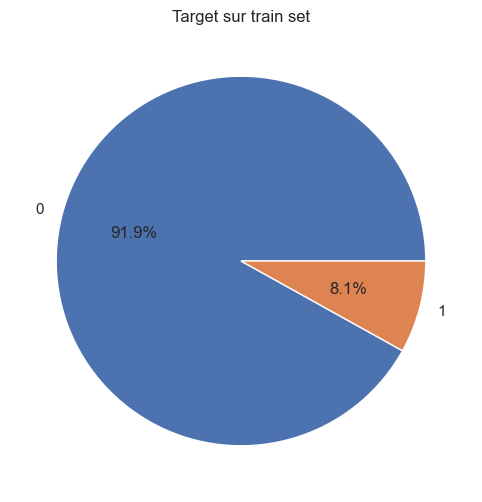

In [273]:
fig = plt.figure()
plt.pie(app_train['TARGET'].value_counts()/len(app_train)*100, autopct='%1.1f%%', labels=[0, 1])
plt.title('Target sur train set')
plt.show()

## Missing Values

Next we can look at the number and percentage of missing values in each column. 

In [275]:
# Function to calculate missing values by column# Funct 
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [276]:
# Missing values statistics
ms = missing_values_table(app_train)
ms.head(20)

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4



Lorsqu'il sera temps de construire nos modèles de machine learning, nous devrons remplir ces valeurs manquantes (connues sous le nom d'imputation). Dans les travaux ultérieurs, nous utiliserons des modèles tels que XGBoost qui peuvent gérer les valeurs manquantes sans besoin d'imputation. Une autre option serait de supprimer les colonnes avec un pourcentage élevé de valeurs manquantes, bien qu'il soit impossible de savoir à l'avance si ces colonnes seront utiles à notre modèle. Par conséquent, nous conserverons toutes les colonnes pour le moment.When it comes time to build our machine learning models, we will have to fill in these missing values (known as imputation). In later work, we will use models such as XGBoost that can [handle missing values with no need for imputation](https://stats.stackexchange.com/questions/235489/xgboost-can-handle-missing-data-in-the-forecasting-phase). Another option would be to drop columns with a high percentage of missing values, although it is impossible to know ahead of time if these columns will be helpful to our model. Therefore, we will keep all of the columns for now.

## Column Types

Let's look at the number of columns of each data type. `int64` and `float64` are numeric variables ([which can be either discrete or continuous](https://stats.stackexchange.com/questions/206/what-is-the-difference-between-discrete-data-and-continuous-data)). `object` columns contain strings and are  [categorical features.](http://support.minitab.com/en-us/minitab-express/1/help-and-how-to/modeling-statistics/regression/supporting-topics/basics/what-are-categorical-discrete-and-continuous-variables/) . 

In [279]:
# Number of each type of column
app_train.dtypes.value_counts()

float64    65
int64      41
object     16
Name: count, dtype: int64

In [280]:
app_train.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


Let's now look at the number of unique entries in each of the `object` (categorical) columns.

In [282]:
# Number of unique classes in each object column
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

Most of the categorical variables have a relatively small number of unique entries. We will need to find a way to deal with these categorical variables! 

In [284]:
# j'identifie rapidement des colonnes inutiles en ayant regardé la description des variables
cols_to_drop = ['WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'NAME_TYPE_SUITE',
               'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
               'AMT_REQ_CREDIT_BUREAU_YEAR', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
               'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'REGION_RATING_CLIENT_W_CITY']
app_train.drop(columns=cols_to_drop, inplace=True)

#Informations normalisées sur le bâtiment où vit le client : Quelle est la taille moyenne (_AVG suffixe), la modalité (_MODE suffixe), la médiane (_MEDI suffixe) 
#de l'appartement, la superficie des parties communes, la superficie habitable, l'âge du bâtiment, le nombre d'ascenseurs, le nombre d'entrées, l'état du bâtiment, 
#le nombre d'étages
cols_to_drop = app_train.columns[app_train.columns.str.contains('_AVG$|_MODE$|_MEDI$')]
app_train.drop(columns=cols_to_drop, inplace=True)

app_train.shape

(307511, 59)

In [285]:
app_train.sample(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
264722,406555,0,Cash loans,M,N,Y,0,261000.0,484789.5,21483.0,418500.0,Pensioner,Incomplete higher,Married,House / apartment,0.004960,-16579,365243,-10451.0,-108,NaN,1,0,0,1,0,0,NaN,2.0,2,XNA,NaN,0.704629,0.332851,0.0,0.0,0.0,0.0,-401.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
50457,158422,0,Cash loans,F,Y,N,0,112500.0,1350000.0,37255.5,1350000.0,Pensioner,Secondary / secondary special,Married,House / apartment,0.008474,-21646,365243,-5659.0,-4448,5.0,1,0,0,1,0,0,NaN,2.0,2,XNA,0.841934,0.713940,NaN,0.0,0.0,0.0,0.0,-1144.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
123813,243585,0,Cash loans,M,Y,N,0,202500.0,241618.5,25636.5,229500.0,Working,Secondary / secondary special,Single / not married,With parents,0.010500,-9802,-2319,-107.0,-2359,35.0,1,1,1,1,0,0,Laborers,1.0,3,Transport: type 2,NaN,0.678931,0.786267,0.0,0.0,0.0,0.0,-1416.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
24350,128325,0,Cash loans,F,N,Y,0,180000.0,127350.0,12726.0,112500.0,Working,Secondary / secondary special,Married,Municipal apartment,0.008625,-15337,-1527,-1964.0,-4432,NaN,1,1,0,1,0,0,Laborers,2.0,2,Self-employed,NaN,0.671951,NaN,1.0,0.0,1.0,0.0,-1911.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
213141,346995,0,Cash loans,F,N,Y,1,202500.0,675000.0,21906.0,675000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,0.018209,-14633,-205,-488.0,-3992,NaN,1,1,0,1,0,0,Laborers,2.0,3,Self-employed,NaN,0.592015,0.328063,1.0,0.0,1.0,0.0,-2168.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [286]:
# Statistiques descriptives des revenus
print(app_train['AMT_INCOME_TOTAL'].describe())

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64


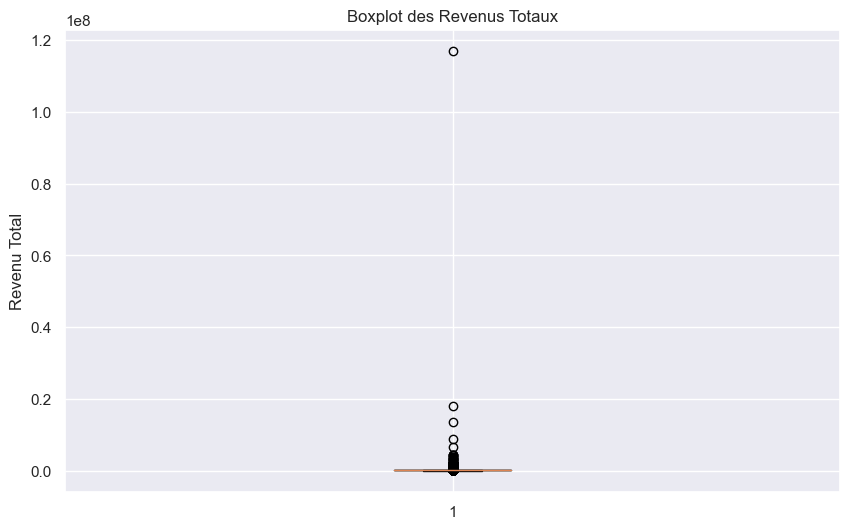

In [287]:
# Boxplot des revenus
plt.figure(figsize=(10, 6))
plt.boxplot(app_train['AMT_INCOME_TOTAL'])
plt.title('Boxplot des Revenus Totaux')
plt.ylabel('Revenu Total')
plt.grid(True)
plt.show()

In [288]:
# Recherche d'outliers avec la méthode Z-score
income_data = app_train['AMT_INCOME_TOTAL']
z_score_outliers = outliers_z_score(income_data)
len(z_score_outliers)

454

In [289]:
outliers_full_data = app_train.loc[z_score_outliers.index]
outliers_full_data.sample(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
16638,119409,0,Revolving loans,F,Y,Y,0,900000.0,540000.0,27000.0,540000.0,Commercial associate,Higher education,Married,House / apartment,0.032561,-18480,-8092,-4259.0,-2031,3.0,1,1,0,1,0,0,Managers,2.0,1,Other,NaN,0.623679,0.334454,0.0,0.0,0.0,0.0,-272.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
117498,236247,0,Cash loans,F,N,N,0,900000.0,1288350.0,37800.0,1125000.0,Commercial associate,Higher education,Married,House / apartment,0.003813,-14789,-1424,-1785.0,-4682,NaN,1,1,0,1,0,1,Sales staff,2.0,2,Business Entity Type 3,0.679346,0.526688,0.554947,0.0,0.0,0.0,0.0,-1877.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
149993,273882,0,Cash loans,M,Y,Y,0,900000.0,1871280.0,180576.0,1800000.0,Commercial associate,Higher education,Single / not married,House / apartment,0.022800,-16886,-2676,-4779.0,-442,2.0,1,1,0,1,0,1,Managers,1.0,2,Business Entity Type 3,0.516443,0.576122,0.472253,0.0,0.0,0.0,0.0,-1927.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
107246,224431,0,Revolving loans,M,Y,Y,0,900000.0,1350000.0,67500.0,1350000.0,Working,Higher education,Married,House / apartment,0.001276,-15585,-1502,-5637.0,-4649,15.0,1,1,0,1,0,0,Managers,2.0,2,Business Entity Type 3,NaN,0.580437,NaN,0.0,0.0,0.0,0.0,-244.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
69804,180978,0,Cash loans,M,Y,N,2,900000.0,521280.0,47938.5,450000.0,Working,Secondary / secondary special,Married,House / apartment,0.010006,-13875,-374,-474.0,-1334,8.0,1,1,0,1,0,0,Managers,4.0,2,Business Entity Type 3,NaN,0.581033,0.511892,2.0,0.0,2.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [290]:
app_train['NAME_CONTRACT_TYPE'].value_counts()

NAME_CONTRACT_TYPE
Cash loans         278232
Revolving loans     29279
Name: count, dtype: int64

In [291]:
app_train['FLAG_OWN_CAR'].value_counts()

FLAG_OWN_CAR
N    202924
Y    104587
Name: count, dtype: int64

In [292]:
app_train['FLAG_OWN_REALTY'].value_counts()

FLAG_OWN_REALTY
Y    213312
N     94199
Name: count, dtype: int64

In [293]:
# 58 modalités sur Type d'organisation :
app_train['ORGANIZATION_TYPE'].value_counts()

ORGANIZATION_TYPE
Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7      

Regroupement des organisations sans les 'types' pour plus de simplicité et transformation des 'XNA' en NaN car peu informatif ou erroné.

In [295]:
group_mapping = {
    'Business Entity Type 3' : 'Business Entity',
    'Business Entity Type 2' : 'Business Entity',
    'Business Entity Type 1' : 'Business Entity',
    
    'Trade: type 7' : 'Trade',
    'Trade: type 3' : 'Trade',
    'Trade: type 2' : 'Trade',
    'Trade: type 6' : 'Trade',
    'Trade: type 1' : 'Trade',
    'Trade: type 4' : 'Trade', 
    'Trade: type 5' : 'Trade',
    
    'Transport: type 4' : 'Transport',
    'Transport: type 2' : 'Transport',
    'Transport: type 3' : 'Transport',
    'Transport: type 1' : 'Transport',
    
    'Industry: type 8' : 'Industry',
    'Industry: type 13' :  'Industry',
    'Industry: type 10' : 'Industry',
    'Industry: type 12' :  'Industry',
    'Industry: type 2' : 'Industry',
    'Industry: type 5' :  'Industry',
    'Industry: type 4' : 'Industry',
    'Industry: type 1' :  'Industry',
    'Industry: type 7' : 'Industry',
    'Industry: type 11' :  'Industry',
    'Industry: type 9' : 'Industry',
    'Industry: type 6' :  'Industry',
    'Industry: type 3' :  'Industry'
    
}

In [296]:
app_train['ORGANIZATION_TYPE'] = app_train['ORGANIZATION_TYPE'].replace(group_mapping)

In [297]:
app_train['ORGANIZATION_TYPE'] = app_train['ORGANIZATION_TYPE'].replace('XNA', np.nan)

In [298]:
# Number of unique classes in each object column
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE      2
CODE_GENDER             3
FLAG_OWN_CAR            2
FLAG_OWN_REALTY         2
NAME_INCOME_TYPE        8
NAME_EDUCATION_TYPE     5
NAME_FAMILY_STATUS      6
NAME_HOUSING_TYPE       6
OCCUPATION_TYPE        18
ORGANIZATION_TYPE      34
dtype: int64

In [299]:
# 34 modalités sur Type d'organisation :
app_train['ORGANIZATION_TYPE'].value_counts()

ORGANIZATION_TYPE
Business Entity        84529
Self-employed          38412
Other                  16683
Trade                  14315
Industry               14311
Medicine               11193
Government             10404
Transport               8990
School                  8893
Kindergarten            6880
Construction            6721
Security                3247
Housing                 2958
Military                2634
Bank                    2507
Agriculture             2454
Police                  2341
Postal                  2157
Security Ministries     1974
Restaurant              1811
Services                1575
University              1327
Hotel                    966
Electricity              950
Insurance                597
Telecom                  577
Emergency                560
Advertising              429
Realtor                  396
Culture                  379
Mobile                   317
Legal Services           305
Cleaning                 260
Religion                 

In [300]:
# 18 modalités sur Type de poste :
app_train['OCCUPATION_TYPE'].value_counts()

OCCUPATION_TYPE
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: count, dtype: int64

On traite le dataset  train data


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,Business Entity,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,School,0.311267,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,Government,NaN,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Taille :-------------------------------------------------------------- (307511, 59)
----------------------------------------------------------------------------------------------------
Valeurs manquantes par colonnes (%): 


,Valeurs manquantes,% total des valeurs
OWN_CAR_AGE,202929,66.0
EXT_SOURCE_1,173378,56.4
OCCUPATION_TYPE,96391,31.3
EXT_SOURCE_3,60965,19.8
ORGANIZATION_TYPE,55374,18.0
OBS_30_CNT_SOCIAL_CIRCLE,1021,0.3
DEF_30_CNT_SOCIAL_CIRCLE,1021,0.3
OBS_60_CNT_SOCIAL_CIRCLE,1021,0.3
DEF_60_CNT_SOCIAL_CIRCLE,1021,0.3
EXT_SOURCE_2,660,0.2


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 307511 valeurs différentes
TARGET---------------------------------------------------------------- [1 0]
NAME_CONTRACT_TYPE---------------------------------------------------- ['Cash loans' 'Revolving loans']
CODE_GENDER----------------------------------------------------------- ['M' 'F' 'XNA']
FLAG_OWN_CAR---------------------------------------------------------- ['N' 'Y']
FLAG_OWN_REALTY------------------------------------------------------- ['Y' 'N']
CNT_CHILDREN---------------------------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL------------------------------------------------------ contient 2548 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 5603 valeurs différent

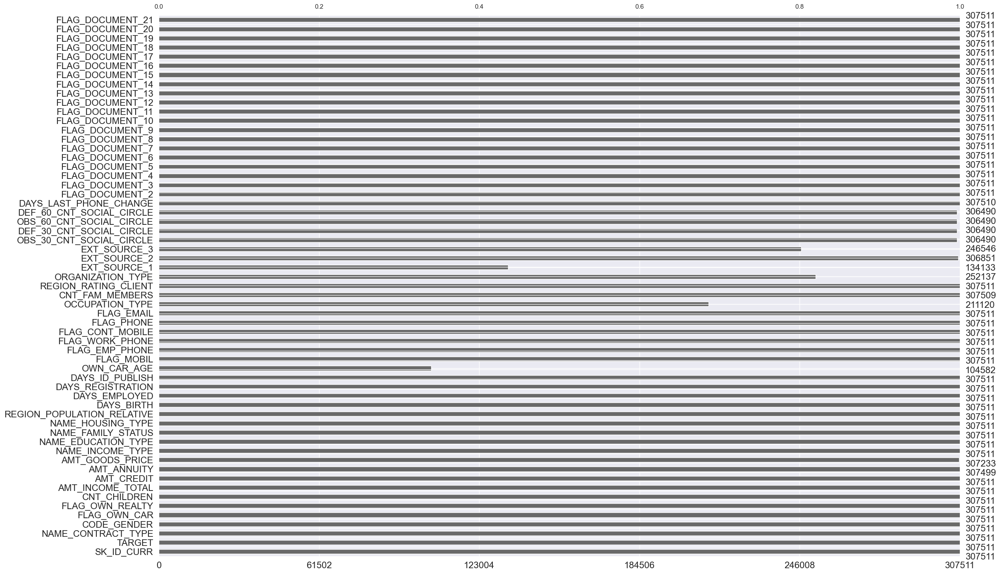

In [301]:
description_dataset(app_train, "train data")

## Anomalies

Un problème auquel nous devons toujours faire attention lors de l'analyse exploratoire des données (EDA) est la présence d'anomalies dans les données. Celles-ci peuvent être dues à des erreurs de frappe, à des erreurs dans les équipements de mesure, ou encore être des mesures valides mais extrêmes. Une façon de détecter quantitativement les anomalies est d'examiner les statistiques d'une colonne en utilisant la méthode describe. 

In [303]:
app_train.iloc[:, 1:].describe().T

,count,mean,std,min,25%,50%,75%,max
TARGET,307511.0,0.080729,0.272419,0.000000e+00,0.000000,0.000000,0.000000,1.000000e+00
CNT_CHILDREN,307511.0,0.417052,0.722121,0.000000e+00,0.000000,0.000000,1.000000,1.900000e+01
AMT_INCOME_TOTAL,307511.0,168797.919297,237123.146279,2.565000e+04,112500.000000,147150.000000,202500.000000,1.170000e+08
AMT_CREDIT,307511.0,599025.999706,402490.776996,4.500000e+04,270000.000000,513531.000000,808650.000000,4.050000e+06
AMT_ANNUITY,307499.0,27108.573909,14493.737315,1.615500e+03,16524.000000,24903.000000,34596.000000,2.580255e+05
AMT_GOODS_PRICE,307233.0,538396.207429,369446.460540,4.050000e+04,238500.000000,450000.000000,679500.000000,4.050000e+06
REGION_POPULATION_RELATIVE,307511.0,0.020868,0.013831,2.900000e-04,0.010006,0.018850,0.028663,7.250800e-02
DAYS_BIRTH,307511.0,-16036.995067,4363.988632,-2.522900e+04,-19682.000000,-15750.000000,-12413.000000,-7.489000e+03
DAYS_EMPLOYED,307511.0,63815.045904,141275.766519,-1.791200e+04,-2760.000000,-1213.000000,-289.000000,3.652430e+05
DAYS_REGISTRATION,307511.0,-4986.120328,3522.886321,-2.467200e+04,-7479.500000,-4504.000000,-2010.000000,0.000000e+00


Les chiffres de la colonne DAYS_BIRTH (l'âge du client en jours au moment du prêt) sont négatifs car ils sont enregistrés par rapport à la date de la demande de prêt actuelle. Pour voir ces statistiques en âge classique ou ancienneté en année, nous pouvons multiplier par -1 et diviser par le nombre de jours dans une année :

In [305]:
(app_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

Those ages look reasonable. There are no outliers for the age on either the high or low end.   
L'âge maximal est 69 ans et le minimal est 20 ans, il n'y a pas d'outliers.    
How about the days of employment?  Nombre de jours avant la demande de prêt où la personne a commencé l'emploi actuel    
max de 365243 jours, c'est aberrant 

In [357]:
(app_train['DAYS_EMPLOYED'] / -365).describe()

count    307511.000000
mean       -174.835742
std         387.056895
min       -1000.665753
25%           0.791781
50%           3.323288
75%           7.561644
max          49.073973
Name: DAYS_EMPLOYED, dtype: float64

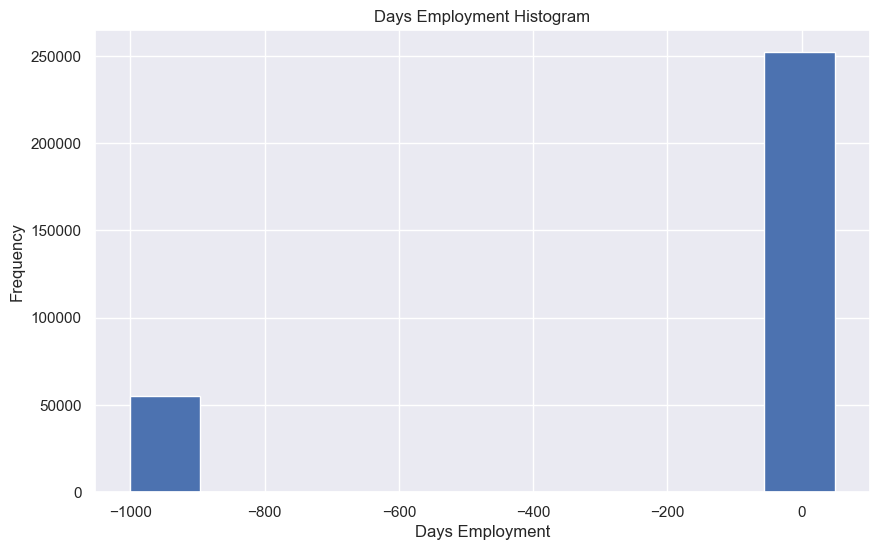

In [359]:
(app_train['DAYS_EMPLOYED'] / -365).plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

In [361]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

Il y a beaucoup cette valeur   
Just out of curiousity, let's subset the anomalous clients and see if they tend to have higher or low rates of default than the rest of the clients.

In [363]:
anom = app_train[app_train['DAYS_EMPLOYED'] == 365243]
non_anom = app_train[app_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


C'est intéressant !  
Il s'avère que les anomalies ont un taux de défaillance plus faible.  
Le traitement des anomalies dépend de la situation exacte, et il n'existe pas de règles fixes. L'une des approches les plus sûres consiste à définir les anomalies comme  
des valeurs manquantes, puis à les compléter (en utilisant l'imputation) avant l'apprentissage automatique.  
Dans ce cas, puisque toutes les anomalies ont exactement la même valeur, nous voulons les compléter avec la même valeur au cas où tous ces prêts ont quelque chose en commun. 
Les valeurs anormales semblent avoir une certaine importance, nous voulons donc indiquer au modèle d'apprentissage automatique si nous avons effectivement rempli ces valeurs.  Comme solution, nous allons remplir les valeurs anormales avec un nombre nul (np.nan) et ensuite créer une nouvelle colonne booléenne indiquant si la valeur était anormale ou non.

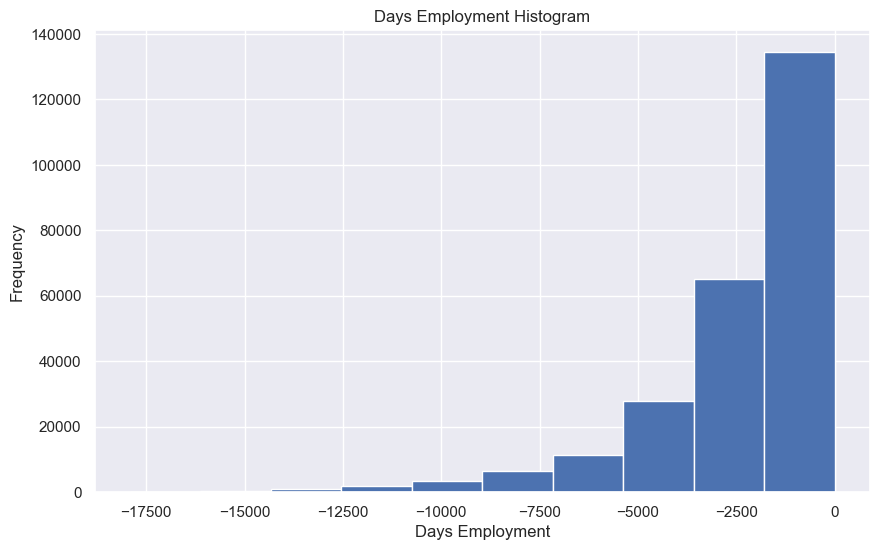

In [95]:
# Create an anomalous flag column
app_train['DAYS_EMPLOYED_ANOM'] = app_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

La distribution semble maintenant beaucoup plus en ligne avec ce que nous attendions, et nous avons également créé une nouvelle colonne pour indiquer au modèle que ces valeurs étaient à l'origine anormales (car nous devrons remplir les valeurs manquantes (NaN) avec une certaine valeur, probablement la médiane de la colonne). Les autres colonnes contenant DAYS dans le dataframe semblent être conformes à nos attentes sans valeurs aberrantes évidentes.

## Corrélation à la Target
Une façon d'essayer de comprendre les données est de rechercher des corrélations entre les caractéristiques numériques et la cible. Nous pouvons calculer le coefficient de corrélation de Pearson entre chaque variable et la cible en utilisant la méthode .corr du dataframe.

Le coefficient de corrélation n'est pas la meilleure méthode pour représenter la "pertinence" d'une caractéristique, mais il nous donne une idée des relations possibles au sein des données.

In [90]:
# Find correlations with the target and sort
# variables numériques
num_features = app_train.select_dtypes(include=['float64', 'int64']).columns

correlations = app_train[num_features].corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 CNT_FAM_MEMBERS             0.009308
CNT_CHILDREN                0.019187
FLAG_WORK_PHONE             0.028524
DEF_60_CNT_SOCIAL_CIRCLE    0.031276
DEF_30_CNT_SOCIAL_CIRCLE    0.032248
OWN_CAR_AGE                 0.037612
DAYS_REGISTRATION           0.041975
FLAG_DOCUMENT_3             0.044346
FLAG_EMP_PHONE              0.045982
DAYS_ID_PUBLISH             0.051457
DAYS_LAST_PHONE_CHANGE      0.055218
REGION_RATING_CLIENT        0.058899
DAYS_EMPLOYED               0.074958
DAYS_BIRTH                  0.078239
TARGET                      1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
AMT_CREDIT                   -0.030369
FLAG_DOCUMENT_6              -0.028602
FLAG_PHONE                   -0.023806
AMT_ANNUITY                  -0.012817
FLAG_D

Jetons un coup d'œil aux corrélations les plus fortes :   
DAYS_BIRTH et DAYS_EMPLOYED sont les corrélations positives les plus fortes (7%).   
Pour l'âge du client, cela signifie que plus le client vieillit, moins il est susceptible de faire défaut sur son prêt (c'est-à-dire que la cible == 0).  
C'est un peu déroutant, donc nous prendrons la valeur absolue de la caractéristique et alors la corrélation sera négative.  

EXT_SOURCE_3, EXT_SOURCE_2 et EXT_SOURCE_1 sont les corrélations négatives les plus fortes (-17%). Mais à quoi correspond ces 3 variables de "score normalisé provenant de sources de données externes" ?

## Age client

In [86]:
# Find the correlation of the positive days since birth and target
app_train['DAYS_BIRTH'] = abs(app_train['DAYS_BIRTH'])
app_train['DAYS_BIRTH'].corr(app_train['TARGET'])

-0.07823930830982712

Plus les clients vieillissent, plus ils ont tendance à rembourser leurs prêts dans les délais.
Examinons cette variable avce un histogramme de l'âge.  
Nous allons mettre l'axe des x en années pour rendre le graphique un peu plus compréhensible.

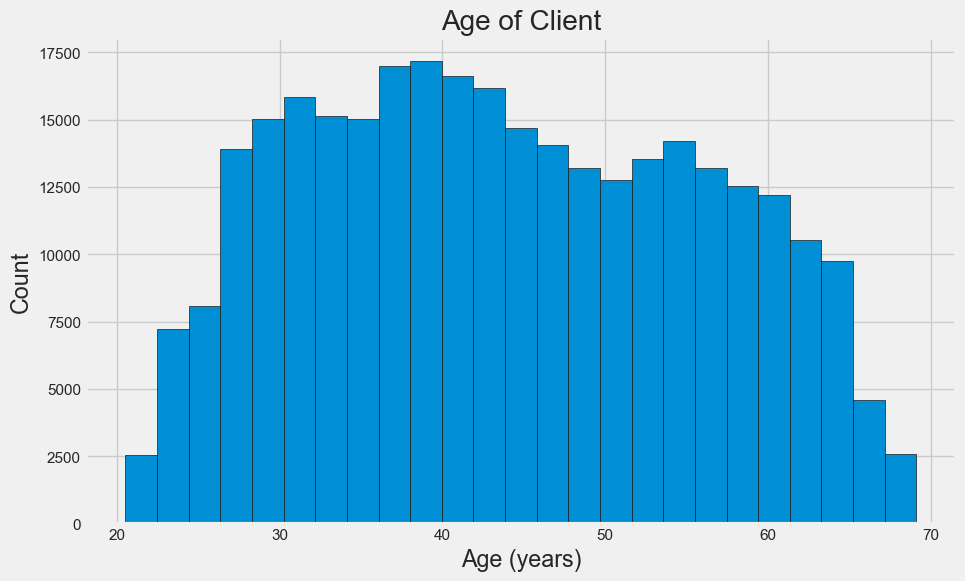

In [88]:
# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(app_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

En soi, la répartition de l'âge ne nous dit pas grand-chose, si ce n'est qu'il n'y a pas d'outliers car tous les âges sont raisonnables. Pour visualiser l'effet de l'âge sur la cible, nous allons ensuite créer un graphique d'estimation de densité par noyau (KDE) coloré par la valeur de la cible. Un graphique d'estimation de densité par noyau montre la distribution d'une seule variable et peut être considéré comme un histogramme lissé (il est créé en calculant un noyau, généralement gaussien, à chaque point de données, puis en moyennant tous les noyaux individuels pour développer une seule courbe lisse). Nous utiliserons la fonction kdeplot de seaborn pour ce graphique.

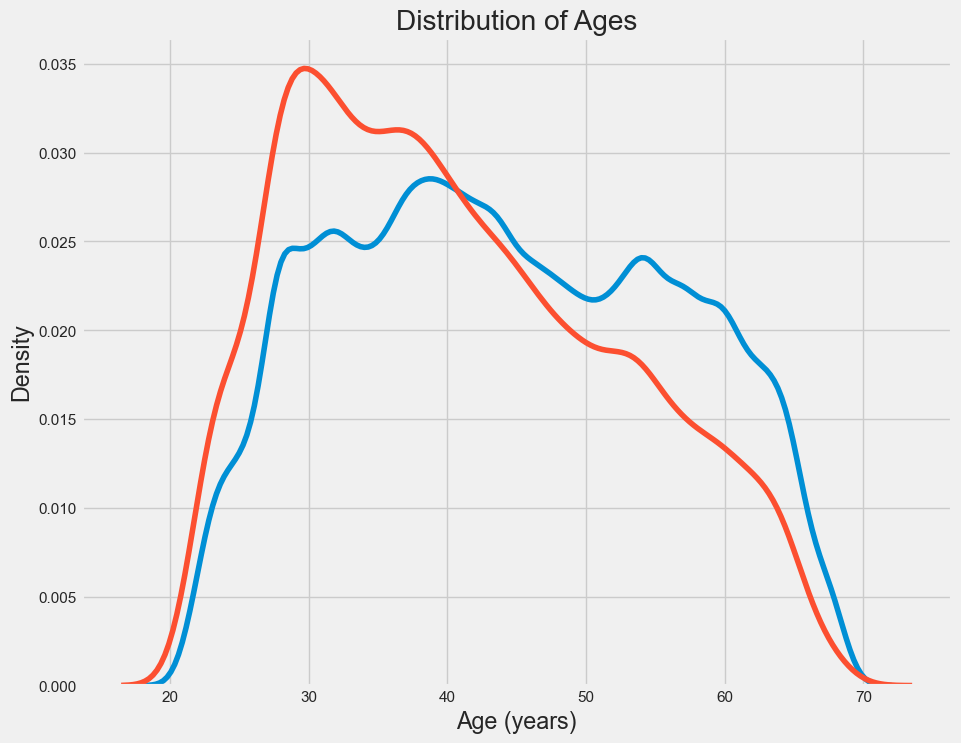

In [90]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

The target == 1 curve skews towards the younger end of the range. Although this is not a significant correlation (-0.07 correlation coefficient), this variable is likely going to be useful in a machine learning model because it does affect the target. Let's look at this relationship in another way: average failure to repay loans by age bracket. 

To make this graph, first we `cut` the age category into bins of 5 years each. Then, for each bin, we calculate the average value of the target, which tells us the ratio of loans that were not repaid in each age category.

In [92]:
# Age information into a separate dataframe
age_data = app_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [93]:
# Group by the bin and calculate averages
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


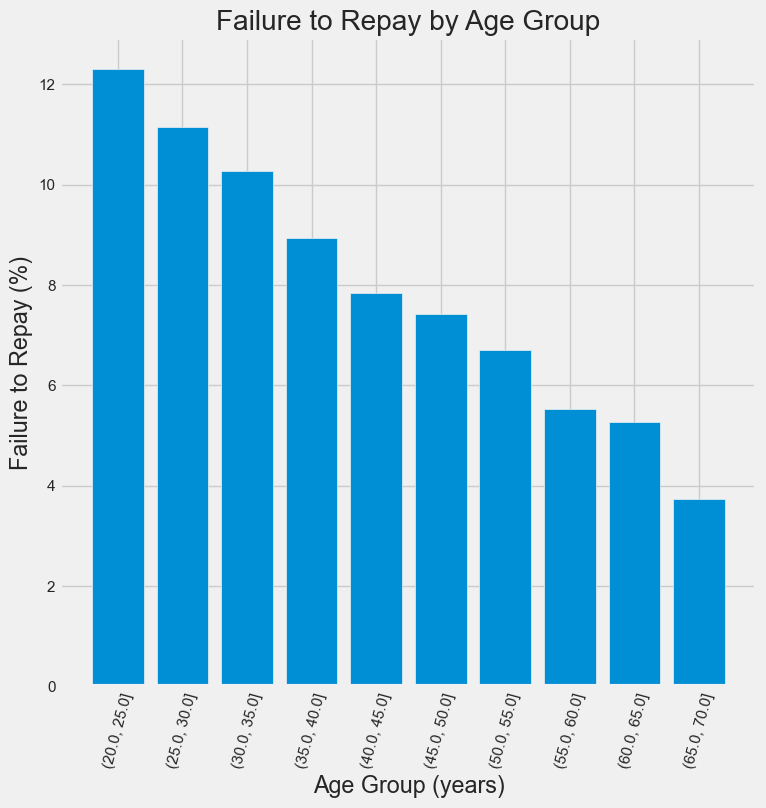

In [94]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

Il y a une tendance claire : les demandeurs plus jeunes sont plus susceptibles de ne pas rembourser le prêt ! Le taux d'échec de remboursement dépasse 10 % pour les trois groupes d'âge les plus jeunes et est inférieur à 5 % pour le groupe d'âge le plus ancien.

Ces informations pourraient être directement utilisées par la banque : étant donné que les clients plus jeunes sont moins susceptibles de rembourser le prêt, il serait peut-être judicieux de leur fournir davantage de conseils en matière de gestion financière ou de planification financière. Cela ne signifie pas que la banque devrait discriminer les clients plus jeunes, mais il serait intelligent de prendre des mesures préventives pour aider ces clients à payer à temps.

## EXT_SOURCE

In [97]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = app_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160472,-0.178919,-0.078239
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,0.600610
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,0.091996
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,0.205478
DAYS_BIRTH,-0.078239,0.600610,0.091996,0.205478,1.000000


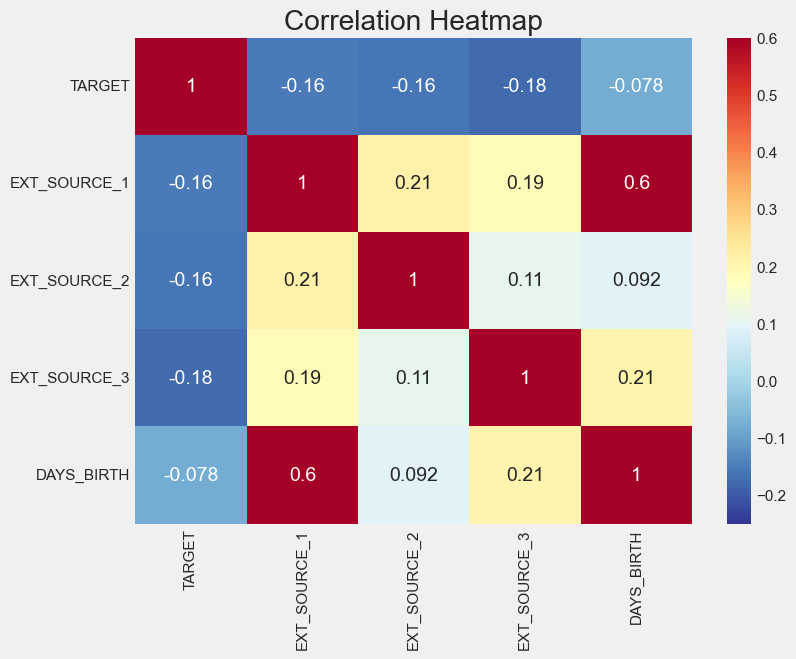

In [98]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

Les trois caractéristiques EXT_SOURCE ont des corrélations négatives avec la cible, ce qui indique que lorsque la valeur de EXT_SOURCE augmente, le client est plus susceptible de rembourser le prêt.   
DAYS_BIRTH est corrélée positivement avec EXT_SOURCE_1, ce qui indique que l'âge du client pourrait être l'un des facteurs pris en compte dans ce score.  

Ensuite, nous pouvons examiner la distribution de chacune de ces caractéristiques colorée en fonction de la valeur de la cible. Cela nous permettra de visualiser l'effet de cette variable sur la cible.

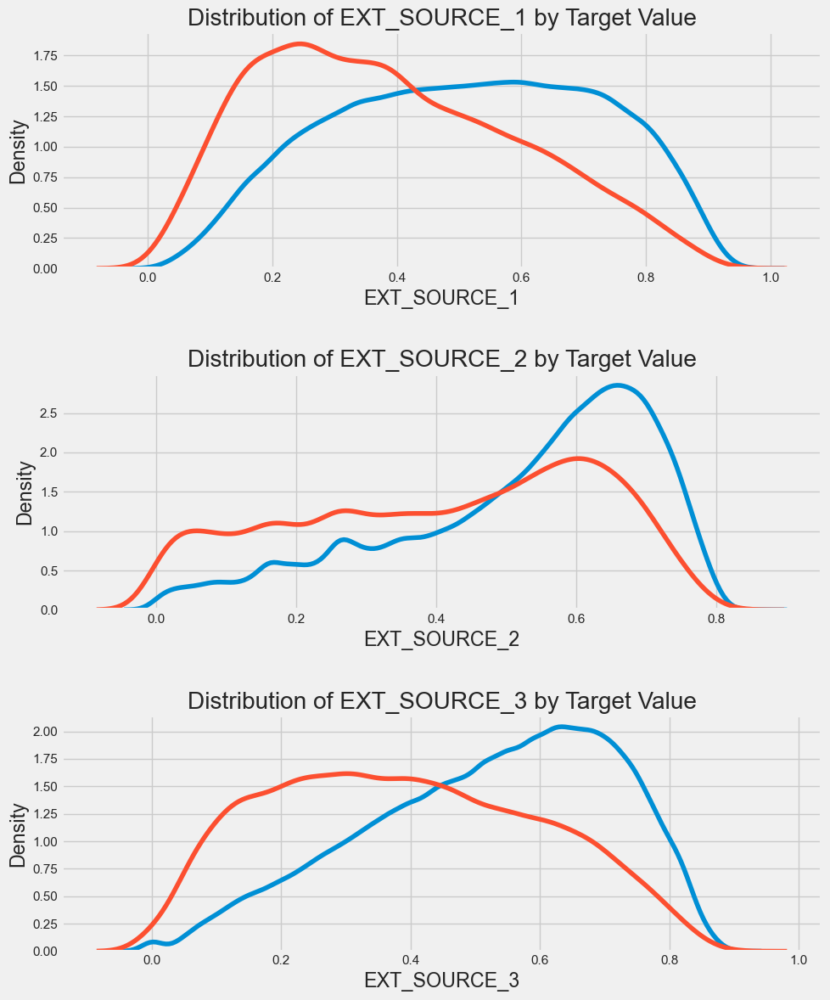

In [100]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    
    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, source], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)
    

EXT_SOURCE_1 et EXT_SOURCE_3 montrent les plus grandes différences entre les valeurs de la cible. Nous pouvons clairement voir que cette caractéristique a une relation avec la probabilité qu'un demandeur rembourse un prêt. L'intensité de la relation linéaire mesurée par le coefficient de Pearson n'est pas très forte mais ces variables seront tout de même utiles pour un modèle d'apprentissage machine afin de prédire si un demandeur remboursera un prêt à temps.

## Pairs Plot

Pour un dernier graphique exploratoire, nous pouvons créer un graphique de paires des variables EXT_SOURCE et de la variable DAYS_BIRTH. Le graphique de paires est un excellent outil d'exploration car il nous permet de voir les relations entre plusieurs paires de variables ainsi que les distributions de variables uniques. Ici, nous utilisons la bibliothèque de visualisation seaborn et la fonction PairGrid pour créer un graphique de paires avec des nuages de points dans le triangle supérieur, des histogrammes sur la diagonale et des graphiques de densité à deux dimensions ainsi que des coefficients de corrélation dans le triangle inférieur.

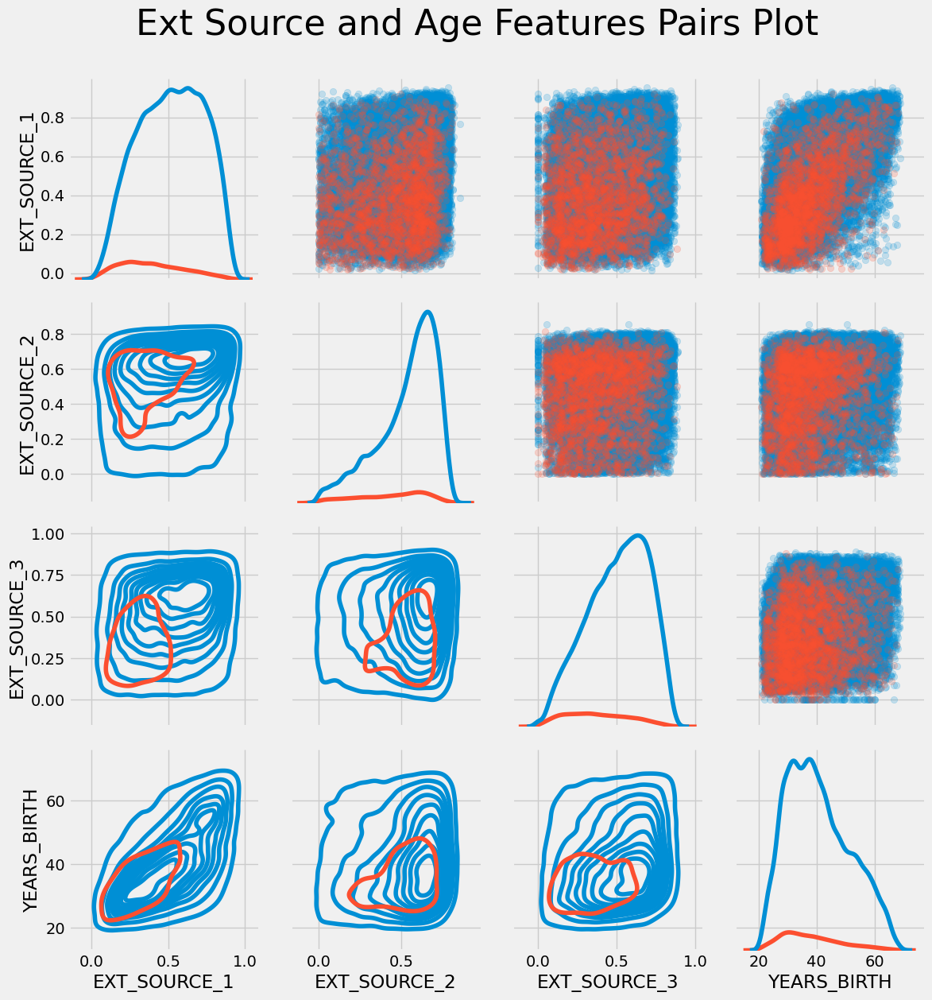

In [101]:
# Copy the data for plotting
plot_data = ext_data.drop(columns = ['DAYS_BIRTH']).copy()

# Add in the age of the client in years
plot_data['YEARS_BIRTH'] = age_data['YEARS_BIRTH']

# Drop na values and limit to first 100000 rows
plot_data = plot_data.dropna().loc[:100000, :]

# Function to calculate correlation coefficient between two columns
def corr_func(x, y, **kwargs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.2, .8), xycoords=ax.transAxes,
                size = 20)

# Create the pairgrid object
grid = sns.PairGrid(data = plot_data, height = 3, diag_sharey=False,
                    hue = 'TARGET', 
                    vars = [x for x in list(plot_data.columns) if x != 'TARGET'])

# Upper is a scatter plot
grid.map_upper(plt.scatter, alpha = 0.2)

# Diagonal is a histogram
grid.map_diag(sns.kdeplot)

# Bottom is density plot
grid.map_lower(sns.kdeplot, cmap = plt.cm.OrRd_r);

plt.suptitle('Ext Source and Age Features Pairs Plot', size = 32, y = 1.05);

Dans ce graphique, le rouge indique les prêts qui n'ont pas été remboursés et le bleu les prêts qui ont été remboursés. Nous pouvons observer les différentes relations au sein des données. Il semble y avoir une relation linéaire positive modérée entre EXT_SOURCE_1 et DAYS_BIRTH (ou équivalemment YEARS_BIRTH), ce qui indique que cette caractéristique peut prendre en compte l'âge du client.

# Feature Engineering    

De l'importance de l'ingénierie des caractéristiques  
Identifier/sélectionner/créer les caractéristiques les plus utiles   

Création de caractéristiques basées sur la connaissance du domaine ou connaissance métier,   
Sélection de caractéristiques sur les autres sources de données,    
Transformation de variables,...    

## Sélection des variables

Sélection des variables interessantes et bien renseignées  
Suppression des caractéristiques trop corrélées donc redondantes  

In [151]:
app_train.shape

(307511, 60)

In [153]:
# suppression variable AMT_GOODS_PRICE (montant du bien acheté avec le financement) trop corrélée à AMT_CREDIT (montant du crédit)]
cols_to_drop = ['AMT_GOODS_PRICE']
#cols_to_drop = ['AMT_GOODS_PRICE','DAYS_EMPLOYED_ANOM']
app_train.drop(columns=cols_to_drop, inplace=True)

app_train.shape

(307511, 59)

## Création de variables "métier"
Domain Features

créer des caractéristiques financières pour capturer ce que nous pensons être important pour déterminer si un client va faire défaut sur un prêt.    
CREDIT_INCOME_PERCENT : pourcentage du montant du crédit par rapport aux revenux annuels client  
ANNUITY_INCOME_PERCENT : pourcentage de l'annuité du prêt par rapport aux revenus annuels client, c'est le taux d'endettement, ratio des dettes sur les revenus. Cet indicateur est primordial car selon la législation française, nous devons respecter des 'quotats' afin de protéger le consommateurs d'un risque de surrendettement. Ce taux ne peut pas dépasser 35% avec possibilité d'augmenter ce pourcentage avec la connaissance client et une analyse plus approfondie.        
CREDIT_TERM : durée du paiement en mois (puisque l'annuité est le montant mensuel dû)  
DAYS_EMPLOYED_PERCENT : pourcentage des jours travaillés par rapport à l'âge du client  

In [155]:
app_train2=app_train.copy()
app_train2['CREDIT_INCOME_PERCENT'] = app_train2['AMT_CREDIT'] / app_train2['AMT_INCOME_TOTAL']
app_train2['ANNUITY_INCOME_PERCENT'] = app_train2['AMT_ANNUITY'] / app_train2['AMT_INCOME_TOTAL']
app_train2['CREDIT_TERM'] = app_train2['AMT_ANNUITY'] / app_train2['AMT_CREDIT']
app_train2['DAYS_EMPLOYED_PERCENT'] = app_train2['DAYS_EMPLOYED'] / app_train2['DAYS_BIRTH']
print(app_train2.shape)
print(app_train2.head())

(307511, 63)
   SK_ID_CURR  TARGET NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR  \
0      100002       1         Cash loans           M            N   
1      100003       0         Cash loans           F            N   
2      100004       0    Revolving loans           M            Y   
3      100006       0         Cash loans           F            N   
4      100007       0         Cash loans           M            N   

  FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0               Y             0          202500.0    406597.5      24700.5   
1               N             0          270000.0   1293502.5      35698.5   
2               Y             0           67500.0    135000.0       6750.0   
3               Y             0          135000.0    312682.5      29686.5   
4               Y             0          121500.0    513000.0      21865.5   

  NAME_INCOME_TYPE            NAME_EDUCATION_TYPE    NAME_FAMILY_STATUS  \
0          Working  Secondar

Représentations bivariées de ces nouvelles variables :

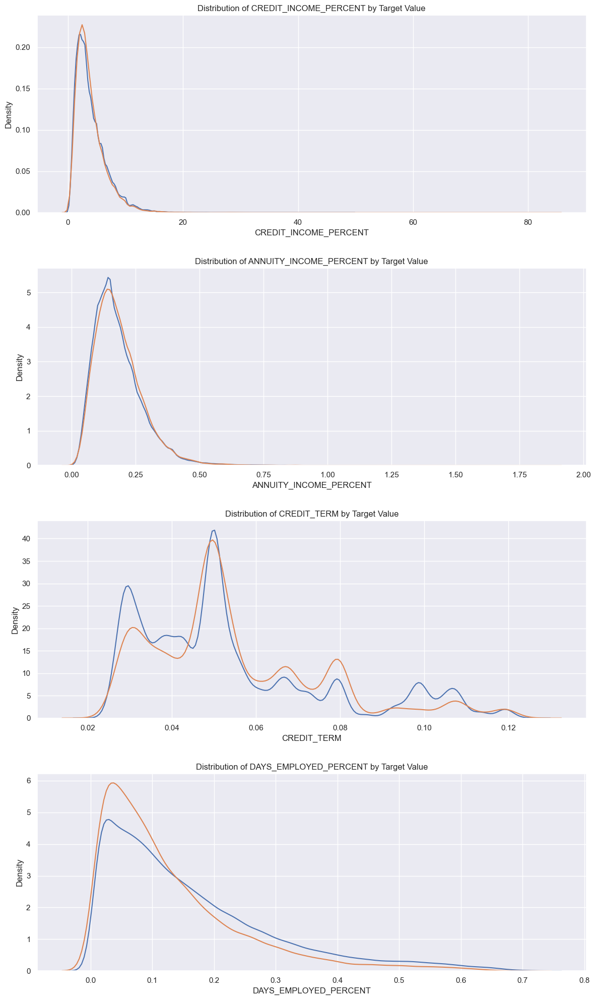

In [154]:
plt.figure(figsize = (12, 20))
# iterate through the new features
for i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):
    
    # create a new subplot for each source
    plt.subplot(4, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train2.loc[app_train2['TARGET'] == 0, feature], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train2.loc[app_train2['TARGET'] == 1, feature], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)

It's hard to say ahead of time if these new features will be useful. The only way to tell for sure is to try them out! 

## Autres sources de données

### bureau et bureau_balance  

je reprends l'eda et la fonction preprocessing de Kaggle  
le principe est d'enrichir notre base de données initiales et actuelles a partir de connaissances de features aggregées sur les autres bases. Les méthodes d'agrégation courantes sont somme, moyenne, minimum, maximum, médiane, variance.  
Dans les données du Bureau : créer des caractéristiques spécifiques pour les crédits actifs et les crédits clôturés (échus).  

bureau contient 1,716,428 lignes et 17 colonnes, détaillant les autres crédits des clients.    
Les données incluent des informations sur le statut du crédit, les montants, et l'historique des paiements.   
bureau_balance comprend 27,299,925 enregistrements et 3 colonnes, relatifs à l'historique mensuel des statuts de crédit par crédit. Les données montrent l'évolution du statut de crédit sur différents mois (MONTHS_BALANCE).

In [157]:
# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    start_time = time.time()
    bureau = pd.read_csv('data/bureau.csv', nrows = num_rows)
    bb = pd.read_csv('data/bureau_balance.csv', nrows = num_rows)
    print(f"Read CSVs: {time.time() - start_time:.2f} seconds")

    start_time = time.time()
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    print(f"One-hot encoding: {time.time() - start_time:.2f} seconds")
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    start_time = time.time()
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    print(f"Aggregations and joins: {time.time() - start_time:.2f} seconds")
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

In [159]:
bureau_agg = bureau_and_balance()

Read CSVs: 8.75 seconds
One-hot encoding: 4.39 seconds
Aggregations and joins: 4.52 seconds


In [161]:
bureau_agg.shape

(305811, 116)

116 features agrégées par 'SK_ID_CURR', ça fait beaucoup !!!

In [164]:
bureau_agg.head()

,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_ANNUITY_MAX,BURO_AMT_ANNUITY_MEAN,BURO_CNT_CREDIT_PROLONG_SUM,BURO_MONTHS_BALANCE_MIN_MIN,BURO_MONTHS_BALANCE_MAX_MAX,BURO_MONTHS_BALANCE_SIZE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,BURO_CREDIT_ACTIVE_Active_MEAN,BURO_CREDIT_ACTIVE_Bad debt_MEAN,BURO_CREDIT_ACTIVE_Closed_MEAN,BURO_CREDIT_ACTIVE_Sold_MEAN,BURO_CREDIT_ACTIVE_nan_MEAN,BURO_CREDIT_CURRENCY_currency 1_MEAN,BURO_CREDIT_CURRENCY_currency 2_MEAN,BURO_CREDIT_CURRENCY_currency 3_MEAN,BURO_CREDIT_CURRENCY_currency 4_MEAN,BURO_CREDIT_CURRENCY_nan_MEAN,BURO_CREDIT_TYPE_Another type of loan_MEAN,BURO_CREDIT_TYPE_Car loan_MEAN,BURO_CREDIT_TYPE_Cash loan (non-earmarked)_MEAN,BURO_CREDIT_TYPE_Consumer credit_MEAN,BURO_CREDIT_TYPE_Credit card_MEAN,BURO_CREDIT_TYPE_Interbank credit_MEAN,BURO_CREDIT_TYPE_Loan for business development_MEAN,BURO_CREDIT_TYPE_Loan for purchase of shares (margin lending)_MEAN,BURO_CREDIT_TYPE_Loan for the purchase of equipment_MEAN,BURO_CREDIT_TYPE_Loan for working capital replenishment_MEAN,BURO_CREDIT_TYPE_Microloan_MEAN,BURO_CREDIT_TYPE_Mobile operator loan_MEAN,BURO_CREDIT_TYPE_Mortgage_MEAN,BURO_CREDIT_TYPE_Real estate loan_MEAN,BURO_CREDIT_TYPE_Unknown type of loan_MEAN,BURO_CREDIT_TYPE_nan_MEAN,BURO_STATUS_0_MEAN_MEAN,BURO_STATUS_1_MEAN_MEAN,BURO_STATUS_2_MEAN_MEAN,BURO_STATUS_3_MEAN_MEAN,BURO_STATUS_4_MEAN_MEAN,BURO_STATUS_5_MEAN_MEAN,BURO_STATUS_C_MEAN_MEAN,BURO_STATUS_X_MEAN_MEAN,BURO_STATUS_nan_MEAN_MEAN,ACTIVE_DAYS_CREDIT_MIN,ACTIVE_DAYS_CREDIT_MAX,ACTIVE_DAYS_CREDIT_MEAN,ACTIVE_DAYS_CREDIT_VAR,ACTIVE_DAYS_CREDIT_ENDDATE_MIN,ACTIVE_DAYS_CREDIT_ENDDATE_MAX,ACTIVE_DAYS_CREDIT_ENDDATE_MEAN,ACTIVE_DAYS_CREDIT_UPDATE_MEAN,ACTIVE_CREDIT_DAY_OVERDUE_MAX,ACTIVE_CREDIT_DAY_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_MAX_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_MAX,ACTIVE_AMT_CREDIT_SUM_MEAN,ACTIVE_AMT_CREDIT_SUM_SUM,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,ACTIVE_AMT_CREDIT_SUM_DEBT_MEAN,ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,ACTIVE_AMT_CREDIT_SUM_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_SUM,ACTIVE_AMT_ANNUITY_MAX,ACTIVE_AMT_ANNUITY_MEAN,ACTIVE_CNT_CREDIT_PROLONG_SUM,ACTIVE_MONTHS_BALANCE_MIN_MIN,ACTIVE_MONTHS_BALANCE_MAX_MAX,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,ACTIVE_MONTHS_BALANCE_SIZE_SUM,CLOSED_DAYS_CREDIT_MIN,CLOSED_DAYS_CREDIT_MAX,CLOSED_DAYS_CREDIT_MEAN,CLOSED_DAYS_CREDIT_VAR,CLOSED_DAYS_CREDIT_ENDDATE_MIN,CLOSED_DAYS_CREDIT_ENDDATE_MAX,CLOSED_DAYS_CREDIT_ENDDATE_MEAN,CLOSED_DAYS_CREDIT_UPDATE_MEAN,CLOSED_CREDIT_DAY_OVERDUE_MAX,CLOSED_CREDIT_DAY_OVERDUE_MEAN,CLOSED_AMT_CREDIT_MAX_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_MAX,CLOSED_AMT_CREDIT_SUM_MEAN,CLOSED_AMT_CREDIT_SUM_SUM,CLOSED_AMT_CREDIT_SUM_DEBT_MAX,CLOSED_AMT_CREDIT_SUM_DEBT_MEAN,CLOSED_AMT_CREDIT_SUM_DEBT_SUM,CLOSED_AMT_CREDIT_SUM_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_SUM,CLOSED_AMT_ANNUITY_MAX,CLOSED_AMT_ANNUITY_MEAN,CLOSED_CNT_CREDIT_PROLONG_SUM,CLOSED_MONTHS_BALANCE_MIN_MIN,CLOSED_MONTHS_BALANCE_MAX_MAX,CLOSED_MONTHS_BALANCE_SIZE_MEAN,CLOSED_MONTHS_BALANCE_SIZE_SUM
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,-1572,-49,-735.000000,240043.666667,-1329.0,1778.0,82.428571,-93.142857,0,0.0,NaN,378000.0,207623.571429,1453365.000,373239.0,85240.928571,596686.5,0.0,0.00000,0.000,10822.5,3545.357143,0,-51.0,0.0,24.571429,172.0,0.428571,0.0,0.571429,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [166]:
# sélection variables
bureau_agg2=bureau_agg[['ACTIVE_AMT_CREDIT_SUM_DEBT_SUM', 'ACTIVE_CREDIT_DAY_OVERDUE_MAX', 'CLOSED_CREDIT_DAY_OVERDUE_MAX']]
display(bureau_agg2.head())
print(bureau_agg2.dtypes.value_counts())

,ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,ACTIVE_CREDIT_DAY_OVERDUE_MAX,CLOSED_CREDIT_DAY_OVERDUE_MAX
SK_ID_CURR,,,
100001,596686.5,0.0,0.0
100002,245781.0,0.0,0.0
100003,0.0,0.0,0.0
100004,NaN,NaN,0.0
100005,568408.5,0.0,0.0


float64    3
Name: count, dtype: int64


In [168]:
# Regroupement des 2 df afin d'en avoir qu'un seul pour l'étude approfondie
print(app_train2.shape)
app_train2 = app_train2.merge(bureau_agg2, on='SK_ID_CURR', how='left')
print(app_train2.shape)

(307511, 63)
(307511, 66)


In [183]:
# Missing values statistics
ms = missing_values_table(app_train2[['ACTIVE_AMT_CREDIT_SUM_DEBT_SUM', 'ACTIVE_CREDIT_DAY_OVERDUE_MAX', 'CLOSED_CREDIT_DAY_OVERDUE_MAX']])
ms

Your selected dataframe has 3 columns.
There are 3 columns that have missing values.


,Missing Values,% of Total Values
ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,90361,29.4
ACTIVE_CREDIT_DAY_OVERDUE_MAX,90361,29.4
CLOSED_CREDIT_DAY_OVERDUE_MAX,77346,25.2


### autres

In [ ]:
'''

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('../input/previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('../input/POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('../input/installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('../input/credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg
'''

## Transformations de variables

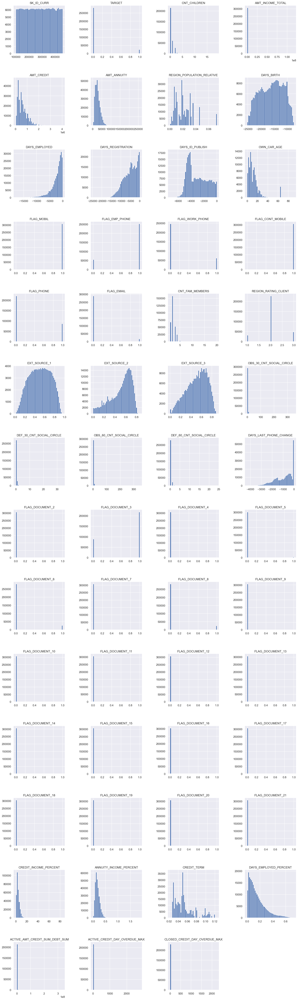

In [188]:
# Graphiques de la répartition des features numériques

numerical_cols = app_train2.select_dtypes(include=['int64', 'float64'])
#numerical_cols = app_train[['AMT_CREDIT', 'AMT_ANNUITY','AMT_INCOME_TOTAL', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']]

n_cols = 4
n_rows = int(np.ceil(len(numerical_cols.columns) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

for i, col in enumerate(numerical_cols.columns):
    ax = axes[i // n_cols, i % n_cols]
    numerical_cols[col].hist(bins=50, ax=ax)
    ax.set_title(col)

for i in range(len(numerical_cols.columns), n_rows * n_cols):
    axes.flat[i].set_visible(False)

plt.show()

In [170]:
# Transformation Log sur les features sélectionnées selon les graphiques
columns_to_transform = ['AMT_CREDIT', 'AMT_ANNUITY','AMT_INCOME_TOTAL', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 
                        'DEF_60_CNT_SOCIAL_CIRCLE', 'ACTIVE_AMT_CREDIT_SUM_DEBT_SUM']
apply_log_transform(app_train2, columns_to_transform)
app_train2.shape

(307511, 74)

In [172]:
app_train2.drop(columns=columns_to_transform, inplace=True)
app_train2.shape

(307511, 66)

In [174]:
app_train2.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,DAYS_EMPLOYED_ANOM,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,ACTIVE_CREDIT_DAY_OVERDUE_MAX,CLOSED_CREDIT_DAY_OVERDUE_MAX,AMT_CREDIT_log,AMT_ANNUITY_log,AMT_INCOME_TOTAL_log,OBS_30_CNT_SOCIAL_CIRCLE_log,DEF_30_CNT_SOCIAL_CIRCLE_log,OBS_60_CNT_SOCIAL_CIRCLE_log,DEF_60_CNT_SOCIAL_CIRCLE_log,ACTIVE_AMT_CREDIT_SUM_DEBT_SUM_log
0,100002,1,Cash loans,M,N,Y,0,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637.0,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,Business Entity,0.083037,0.262949,0.139376,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,2.007889,0.121978,0.060749,0.067329,0.0,0.0,12.915581,10.114619,12.218500,1.098612,1.098612,1.098612,1.098612,12.4122
1,100003,0,Cash loans,F,N,N,0,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188.0,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,School,0.311267,0.622246,NaN,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,4.790750,0.132217,0.027598,0.070862,0.0,0.0,14.072865,10.482892,12.506181,0.693147,NaN,0.693147,NaN,NaN
2,100004,0,Revolving loans,M,Y,Y,0,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225.0,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,Government,NaN,0.555912,0.729567,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,2.000000,0.100000,0.050000,0.011814,NaN,0.0,11.813037,8.817446,11.119898,NaN,NaN,NaN,NaN,NaN
3,100006,0,Cash loans,F,N,Y,0,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039.0,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,Business Entity,NaN,0.650442,NaN,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,2.316167,0.219900,0.094941,0.159905,NaN,NaN,12.652947,10.298481,11.813037,1.098612,NaN,1.098612,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038.0,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,Religion,NaN,0.322738,NaN,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,False,4.222222,0.179963,0.042623,0.152418,NaN,0.0,13.148033,9.992711,11.707678,NaN,NaN,NaN,NaN,NaN


In [220]:
app_train2.dtypes

TARGET                                  int64
NAME_CONTRACT_TYPE                     object
CODE_GENDER                            object
FLAG_OWN_CAR                           object
FLAG_OWN_REALTY                        object
CNT_CHILDREN                            int64
NAME_INCOME_TYPE                       object
NAME_EDUCATION_TYPE                    object
NAME_FAMILY_STATUS                     object
NAME_HOUSING_TYPE                      object
REGION_POPULATION_RELATIVE            float64
DAYS_BIRTH                              int64
DAYS_EMPLOYED                         float64
DAYS_REGISTRATION                     float64
DAYS_ID_PUBLISH                         int64
OWN_CAR_AGE                           float64
FLAG_MOBIL                              int64
FLAG_EMP_PHONE                          int64
FLAG_WORK_PHONE                         int64
FLAG_CONT_MOBILE                        int64
FLAG_PHONE                              int64
FLAG_EMAIL                        

# Modélisations   

Baseline

Pour une approche de base naïve, nous pourrions simplement prédire la même probabilité pour tous les exemples dans l'ensemble de test. Étant donné que notre objectif est de prédire la probabilité de non-remboursement du prêt, une estimation raisonnable lorsque l'on est incertain serait de choisir 0,5 pour toutes les observations dans l'ensemble de test. Cette approche conduirait à une aire sous la courbe ROC (AUC ROC) de 0,5 dans la compétition (le hasard pur dans une tâche de classification obtient un score de 0,5).

Cependant, étant donné que nous anticipons déjà ce score, il n'est pas nécessaire de procéder avec une prédiction de base naïve. À la place, utilisons un modèle légèrement plus sophistiqué comme baseline réelle : la régression logistique

## Logistic Regression Implementation

Objectif : établir une baseline avec les caractéristiques du fichier de données principales. Puis démarche itérative afin de tester l'intégration de nouvelles données (caractéristiques "métier", autres sources de données, transformations de variables,...) et de tester l'algorithme LightGBM et ses hyperparamètres.     

Régression Logistique : modèle linéaire classique pour de la classification binaire. Ce modèle est apprécié pour sa simplicité, son interprétabilité et sa capacité à fournir des probabilités directes de défaut de paiement.

LightGBM (Gradient Boosting Machine) Classifier : algorithme non-linéaire de boosting basé sur le gradient qui est optimisé pour être extrêmement efficace en termes de mémoire et de vitesse. LightGBM est particulièrement puissant pour traiter de grands volumes de données et peut gérer efficacement des données catégorielles.  
boosting = méthode d'ensemble séquentielle, ensemble d'arbres de décision faibles (ou peu profonds) où chaque arbre successif est formé pour corriger les erreurs des arbres précédents.   

Prétraitement des données en comblant les valeurs manquantes (imputation), en encodant les variables catégorielles et en normalisant les caractéristiques (mise à l'échelle).    
Utilisation de pipelines (automatise et sécurise la préparation des données et isole correctement les ensembles d'entraînement et de test pour éviter le phénomène de "data leakage" (fuite de données))

### train test split

In [176]:
# Number of each type of column
app_train.dtypes.value_counts()

int64      32
float64    16
object     10
bool        1
Name: count, dtype: int64

In [178]:
app_train.dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
CNT_CHILDREN                    int64
AMT_INCOME_TOTAL              float64
AMT_CREDIT                    float64
AMT_ANNUITY                   float64
NAME_INCOME_TYPE               object
NAME_EDUCATION_TYPE            object
NAME_FAMILY_STATUS             object
NAME_HOUSING_TYPE              object
REGION_POPULATION_RELATIVE    float64
DAYS_BIRTH                      int64
DAYS_EMPLOYED                 float64
DAYS_REGISTRATION             float64
DAYS_ID_PUBLISH                 int64
OWN_CAR_AGE                   float64
FLAG_MOBIL                      int64
FLAG_EMP_PHONE                  int64
FLAG_WORK_PHONE                 int64
FLAG_CONT_MOBILE                int64
FLAG_PHONE                      int64
FLAG_EMAIL                      int64
OCCUPATION_T

In [180]:
app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,DAYS_EMPLOYED_ANOM
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637.0,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,Business Entity,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188.0,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,School,0.311267,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225.0,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,Government,NaN,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039.0,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,Business Entity,NaN,0.650442,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038.0,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,Religion,NaN,0.322738,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,False


In [258]:
# ID clients en index pour conservation
app_train = app_train.set_index('SK_ID_CURR')

KeyError: "None of ['SK_ID_CURR'] are in the columns"

In [175]:
# Séparation des caractéristiques (X) et de la cible (y)
X = app_train.drop(columns=['TARGET'])
y = app_train['TARGET']

In [261]:
# Séparation en train | test à hauteur de 20 % pour le test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print('Train set:', X_train.shape)
print('Test set:', X_test.shape)

Train set: (246008, 64)
Test set: (61503, 64)


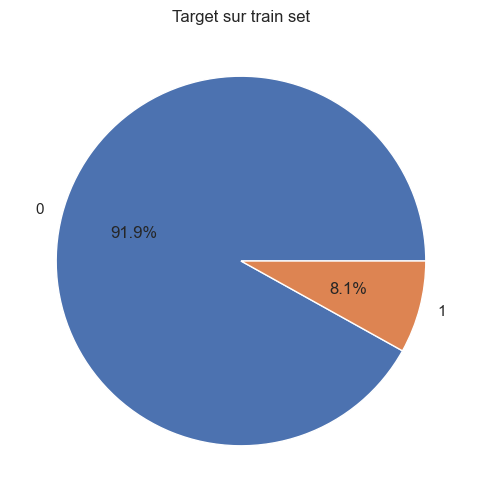

In [222]:
fig = plt.figure()
plt.pie(y_train.value_counts()/len(y_train)*100, autopct='%1.1f%%', labels=[0, 1])
plt.title('Target sur train set')
plt.show()

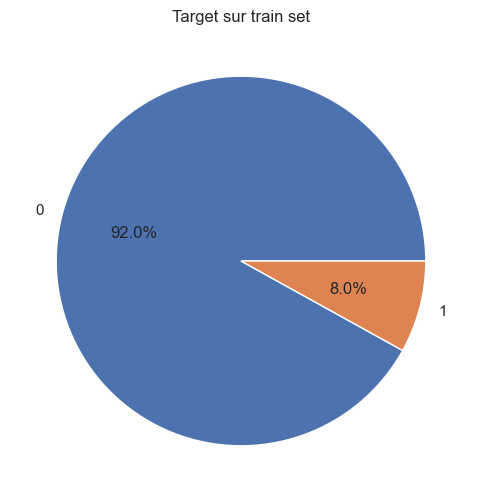

In [224]:
fig = plt.figure()
plt.pie(y_test.value_counts()/len(y_test)*100, autopct='%1.1f%%', labels=[0, 1])
plt.title('Target sur train set')
plt.show()

In [179]:
X_test.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,DAYS_EMPLOYED_ANOM
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
384575,Cash loans,M,Y,N,2,207000.0,465457.5,52641.0,Commercial associate,Secondary / secondary special,Married,House / apartment,0.009630,-13297,-762.0,-637.0,-4307,19.0,1,1,0,1,0,0,Sales staff,4.0,2,Business Entity,0.675878,0.604894,0.000527,0.0,0.0,0.0,0.0,-2.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
214010,Cash loans,F,Y,Y,0,247500.0,1281712.5,48946.5,Commercial associate,Higher education,Single / not married,House / apartment,0.006852,-14778,-1141.0,-1610.0,-4546,11.0,1,1,0,1,0,1,Managers,1.0,3,Business Entity,0.430827,0.425351,0.712155,2.0,0.0,2.0,0.0,-1071.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
142232,Cash loans,F,Y,N,0,202500.0,495000.0,39109.5,Working,Secondary / secondary special,Married,House / apartment,0.035792,-17907,-639.0,-2507.0,-1461,4.0,1,1,1,1,0,0,Sales staff,2.0,2,Self-employed,0.527239,0.531760,0.207964,5.0,0.0,5.0,0.0,-1435.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
389171,Cash loans,F,N,Y,0,247500.0,254700.0,24939.0,State servant,Secondary / secondary special,Widow,House / apartment,0.046220,-19626,-6982.0,-11167.0,-3158,NaN,1,1,0,1,0,0,High skill tech staff,1.0,1,Business Entity,NaN,0.693521,0.614414,0.0,0.0,0.0,0.0,-2000.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
283617,Cash loans,M,N,Y,0,112500.0,308133.0,15862.5,Working,Secondary / secondary special,Single / not married,House / apartment,0.018850,-20327,-1105.0,-7299.0,-494,NaN,1,1,0,1,0,0,Laborers,1.0,2,Business Entity,0.654882,0.560690,0.636376,0.0,0.0,0.0,0.0,-173.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False


In [165]:
y_test.head()

SK_ID_CURR
384575    0
214010    0
142232    0
389171    0
283617    0
Name: TARGET, dtype: int64

In [181]:
# Feature names
features = list(X_train.columns)

In [175]:
print(features)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 

### modélisation manuelle

In [199]:
# Séparation des variables numériques et catégorielles
num_features = X.select_dtypes(include=['float64', 'int64']).columns
cat_features = X.select_dtypes(include=['object', 'bool']).columns
print(len(num_features))
print(len(cat_features))

# Stratégie d'imputation des valeurs manquantes et normalisation et encoding
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# preprocessor selon type de variables
preprocessor = ColumnTransformer([
    ('num', num_pipeline, num_features),
    ('cat', cat_pipeline, cat_features)
])

# Application du preprocesseur sur les données d'entraînement et de test
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test) 

# Conversion en DataFrame pour une meilleure manipulation
X_train_preprocessed_df = pd.DataFrame(X_train_preprocessed, columns=num_features.tolist() + preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(cat_features).tolist())
X_test_preprocessed_df = pd.DataFrame(X_test_preprocessed, columns=num_features.tolist() + preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(cat_features).tolist())

# Affichage du DataFrame X_test prétraité
print(X_test_preprocessed_df.head())

46
11
   CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0      2.197655          0.368709   -0.332881     1.758798   
1     -0.577566          0.756159    1.692073     1.504187   
2     -0.577566          0.325659   -0.259593     0.826257   
3     -0.577566          0.756159   -0.855726    -0.150323   
4     -0.577566         -0.535340   -0.723170    -0.775842   

   REGION_POPULATION_RELATIVE  DAYS_BIRTH  DAYS_EMPLOYED  DAYS_REGISTRATION  \
0                   -0.812337    0.628702       0.765429           1.234801   
1                   -1.013378    0.289121       0.586520           0.958489   
2                    1.080973   -0.428331       0.823492           0.703760   
3                    1.835633   -0.822483      -2.170755          -1.755497   
4                   -0.145098   -0.983217       0.603514          -0.657067   

   DAYS_ID_PUBLISH   OWN_CAR_AGE  FLAG_MOBIL  FLAG_EMP_PHONE  FLAG_WORK_PHONE  \
0        -0.870744  1.000422e+00    0.002016         0.46886     

In [23]:
# Configuration de l'expérience MLflow pour le suivi des modèles
mlflow.set_experiment('essai')

2024/06/26 09:22:04 INFO mlflow.tracking.fluent: Experiment with name 'essai' does not exist. Creating a new experiment.


<Experiment: artifact_location='file:///C:/Users/gwenn/mlruns/1', creation_time=1719386524155, experiment_id='1', last_update_time=1719386524155, lifecycle_stage='active', name='essai', tags={}>

In [246]:
# Define the model hyperparameters
params = { "solver": "lbfgs", "max_iter": 1000, "class_weight": "balanced", "random_state": 42 }

# Train the model
lr = LogisticRegression(**params)
lr.fit(X_train_preprocessed, y_train)

# Prédictions probabilistes, la 2ème colonne est la probabilité d'être 1
pred_proba = lr.predict_proba(X_train_preprocessed)[:, 1]
train_auc = roc_auc_score(y_train, pred_proba)
print(f'AUROC on the train set: {train_auc}')

# Prédictions probabilistes sur Test Set
y_pred_proba = lr.predict_proba(X_test_preprocessed)[:, 1]
test_auc = roc_auc_score(y_test, y_pred_proba)
print(f'AUROC on the test set: {test_auc}')

# Start an MLflow run (1 experimentation contient plusieurs run)
with mlflow.start_run(run_name='LogisticRegression_v0'):
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the metrics
    mlflow.log_metric("train_roc_auc", train_auc)
    mlflow.log_metric("test_roc_auc", test_auc)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Basic LR model")

    # Infer the model signature
    signature = infer_signature(X_train_preprocessed, lr.predict(X_train_preprocessed))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=lr,
        artifact_path="credit scoring",
        signature=signature,
        input_example=X_train_preprocessed,
        registered_model_name="tracking-LR-model",
    )
mlflow.end_run()

AUROC on the train set: 0.7439370744379574
AUROC on the test set: 0.7445329459543109


Successfully registered model 'tracking-LR-model'.
2024/06/26 10:45:05 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: tracking-LR-model, version 1
Created version '1' of model 'tracking-LR-model'.


notes sur tests précédemment réalisés :  
Avec class_weight='balanced' et en optimisant C, les résultats sont meilleurs sur la regression logistique  
-initial : AUROC on the training set: 0.69    
-avec class_weight='balanced' : AUROC on the training set: 0.72    
-avec class_weight='balanced' et sans modifier C : AUROC on the training set: 0.75  mais risque de surapprentissage    

Avec la validation croisée stratifiée, les résultats sont plus stables.  

### modélisation automatisée
avec la fonction new_evaluate_model

In [183]:
# Configuration de l'expérience MLflow pour le suivi des modèles
mlflow.set_experiment('credit_risk_prediction')
#experiment_id = mlflow.set_experiment('credit_risk_prediction')

<Experiment: artifact_location='file:///C:/Users/gwenn/mlruns/2', creation_time=1719396088096, experiment_id='2', last_update_time=1719396088096, lifecycle_stage='active', name='credit_risk_prediction', tags={}>

In [185]:
# Séparation des variables numériques et catégorielles
num_features = X.select_dtypes(include=['float64', 'int64']).columns
cat_features = X.select_dtypes(include=['object', 'bool']).columns
print(len(num_features))
print(len(cat_features))

# Stratégie d'imputation des valeurs manquantes et normalisation et encoding
num_pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler(with_mean=False))
cat_pipeline = make_pipeline(SimpleImputer(strategy='most_frequent'), OneHotEncoder(handle_unknown='ignore')) 
                                                                                            #pour ignorer les catégories inconnues lors de la transformation
                                                                                          
# preprocessor selon type de variables
preprocessor = make_column_transformer((num_pipeline, num_features), (cat_pipeline, cat_features))

46
11


In [187]:
# Validation croisée stratifiée
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Métriques à évaluer avec cross_validate
scoring = {'f1': 'f1', 'roc_auc': 'roc_auc'}

# Liste pour stocker les résultats
all_results = []

# Liste pour stocker les résultats Best Model
best_model = []

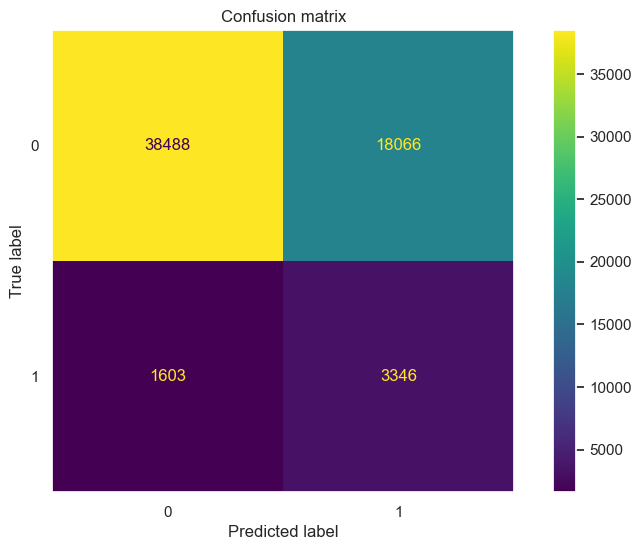

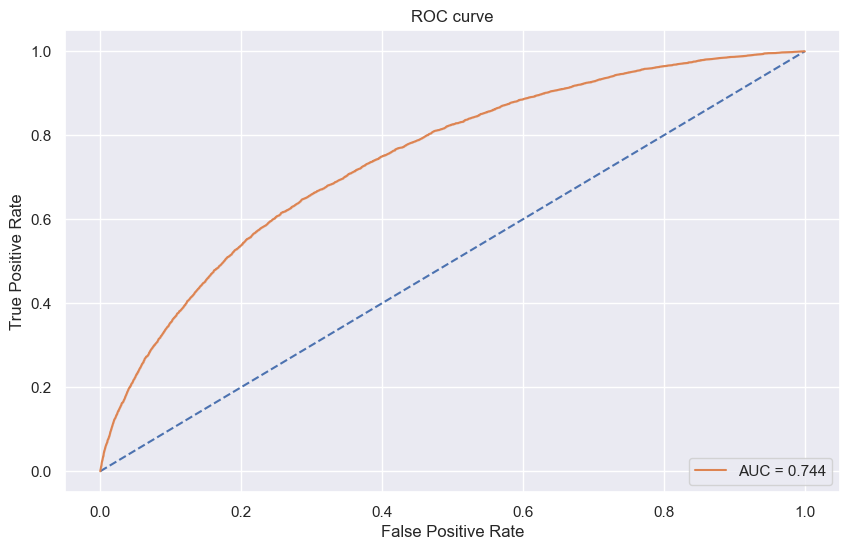

Successfully registered model 'LogisticRegression_57f'.
2024/07/01 17:20:07 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LogisticRegression_57f, version 1
Created version '1' of model 'LogisticRegression_57f'.


LogisticRegression_57f Results:
Train AUC: 0.7430171822699069
Test AUC: 0.7443680072224901
Optimal Threshold: 0.52
Optimal Business Cost: 136023
Training Time: 46.26832151412964


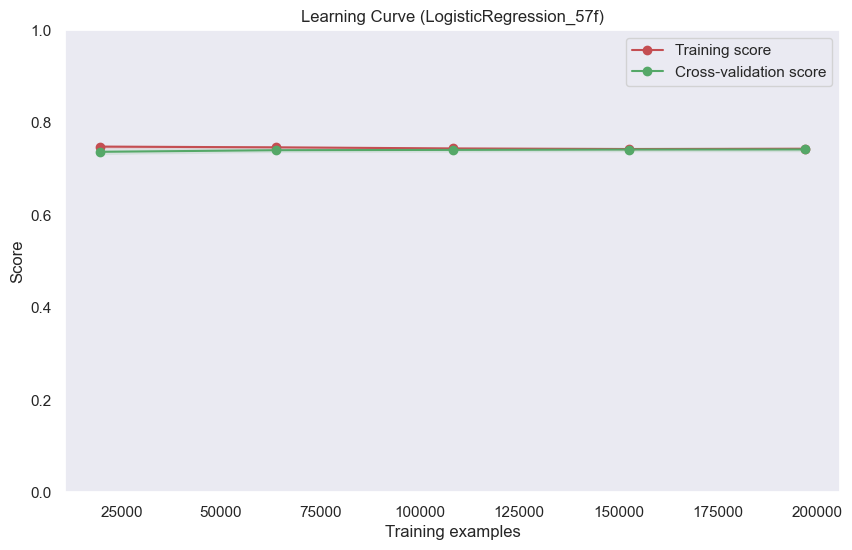

Prédictions pour les données de test:
            prediction
SK_ID_CURR            
384575        0.777685
214010        0.285519
142232        0.670384
389171        0.175106
283617        0.486281


38022

In [203]:
# LogisticRegression
lr_clf = LogisticRegression(random_state=42, class_weight='balanced')
param_grid_lr = { 'classifier__C': [0.0001, 0.001, 0.01, 0.1, 1] }
results_lr, test_results_lr = new_evaluate_model(lr_clf, 'LogisticRegression_57f', X_train, y_train, X_test, y_test, scoring, stratified_kfold, param_grid_lr)
all_results.append(results_lr)
gc.collect()

Seuil optimal à 0.52 signifie qu'utiliser 0.52 comme seuil de décision (au lieu de 0.5) permet de minimiser le coût total en fonction des pénalités spécifiques pour les erreurs de classification (1 pour un faux positif et 10 pour un faux négatif).   

best_param classifier__C=0.01 (vs C=1.0 par défaut) : réduire le paramètre de régularisation diminue le surajustement.   

**Test AUC de 0.74**

Métrique AUC (Area Under the Curve ou surface sous la Courbe ROC Receiver Operating Characteristic) ou AUROC. La courbe ROC trace le taux de vrais positifs (recall ou sensibility) par rapport au taux de faux positifs (specificity). Le seuil commence à 0 dans le coin supérieur droit et va jusqu'à 1 dans le coin inférieur gauche. Une courbe qui est à gauche et au-dessus d'une autre courbe indique un meilleur modèle. Cette métrique est comprise entre 0 et 1, un meilleur modèle ayant un score plus élevé. Un modèle qui devine simplement au hasard aura une ROC AUC de 0,5. Lorsque nous mesurons un classificateur selon la ROC AUC, nous générons une probabilité entre 0 et 1. Cela est adapté aux problèmes avec des classes déséquilibrées.   

L'argument class_weight='balanced' est une méthode simple et efficace pour gérer le déséquilibre des classes. Cela permet de donner plus de poids aux classes minoritaires, ce qui peut aider le modèle à mieux apprendre les caractéristiques de ces classes et à améliorer la performance globale.   
Impact sur la fonction de coût : en ajustant les poids des classes, class_weight='balanced' modifie la fonction de coût (log-loss) pour donner plus de pénalité aux erreurs sur les échantillons de la classe minoritaire. Cela conduit le modèle à se concentrer davantage sur ces échantillons lors de l'apprentissage.

RandomForestClassifier a été testé et ne s'avère pas beaucoup plus performant que le régression logistique, donc je fais l'impasse sur ce modèle et je passe directement au LightGBM

## Improved Model: LightGBM  
Le Boosting permet de construire des modèles les uns après les autres, en demandant à chaque modèle de corriger les erreurs de son prédécesseur.   
Le Gradient Boosting Machine est actuellement le modèle principal pour l'apprentissage sur des ensembles de données structurées.  
Recherche des meilleurs hyperparamètres :  
**learning_rate** (ou taux d'apprentissage) détermine à quel point chaque arbre corrige les erreurs des arbres précédents      
**n_estimators** représente le nombre d'arbres à construire. Plus ce nombre est élevé, plus le modèle sera complexe

[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3192
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 123
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Number of positive: 15901, number of negative: 180905
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3198
[LightGBM] [Info] Number of data points in the train set: 196806, number of used features: 123
[LightGBM] [In

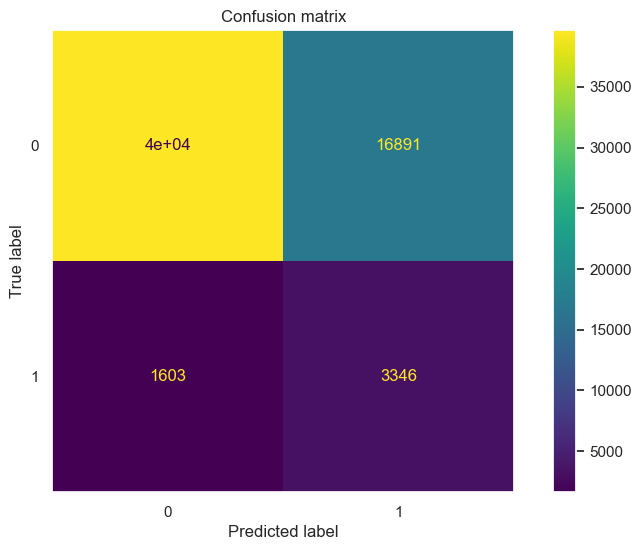

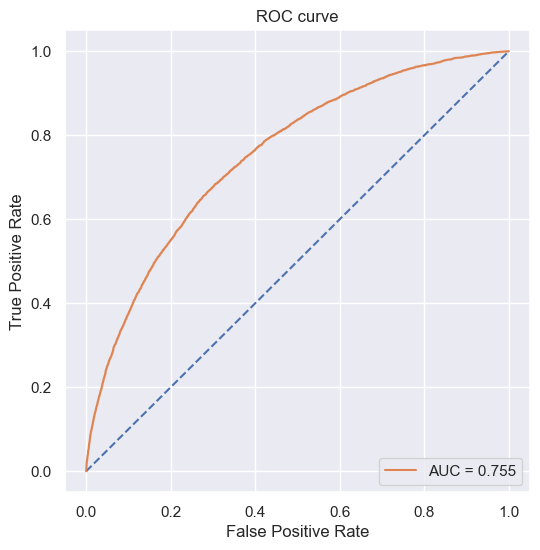

Successfully registered model 'LightGBMClassifier_57f'.
2024/07/01 18:13:54 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LightGBMClassifier_57f, version 1
Created version '1' of model 'LightGBMClassifier_57f'.


LightGBMClassifier_57f Results:
Train AUC: 0.7889082404036472
Test AUC: 0.755314831216878
Optimal Threshold: 0.51
Optimal Business Cost: 132370
Training Time: 1536.1079099178314


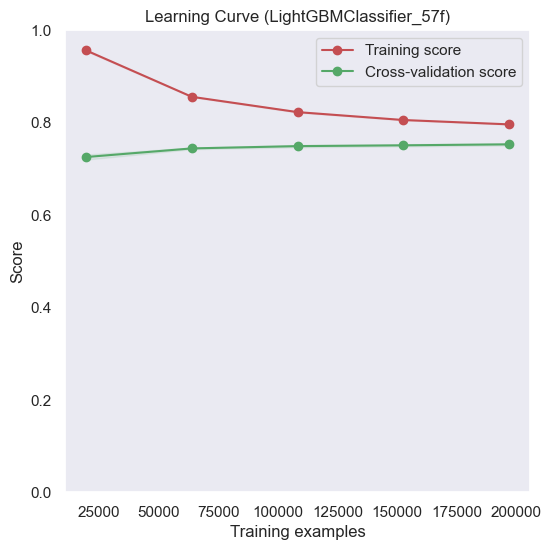

Prédictions pour les données de test:
            prediction
SK_ID_CURR            
384575        0.732376
214010        0.323136
142232        0.726309
389171        0.157559
283617        0.491451


22243

In [232]:
# LightGBMClassifier 
lgb_clf = lgb.LGBMClassifier(random_state=42, class_weight='balanced', objective='binary')
param_grid_lgb = {'classifier__n_estimators': [50, 100, 500, 1000], 'classifier__learning_rate': [0.01, 0.02, 0.05, 0.1] }
results_lgb, test_results_lgb = new_evaluate_model(lgb_clf, 'LightGBMClassifier_57f', X_train, y_train, X_test, y_test, scoring, stratified_kfold, param_grid_lgb)
all_results.append(results_lgb)
gc.collect()

best_param classifier__learning_rate=0.02 (vs 0.1 par défaut)  
classifier__n_estimators=500 (vs 100 par défaut)  

In [235]:
# Affichage des résultats 
all_results_df = pd.concat(all_results, ignore_index=True)
all_results_df

,Model,Train AUC,Test AUC,Optimal Threshold,Optimal Business Cost,Training Time
0,LogisticRegression_57f,0.743017,0.744368,0.52,136023,46.268322
1,LightGBMClassifier_57f,0.788908,0.755315,0.51,132370,1536.107910


**meilleur modèle avec Test AUC de 0.76**

## Ajout features

In [182]:
# Number of each type of column
app_train2.dtypes.value_counts()

int64      32
float64    23
object     10
bool        1
Name: count, dtype: int64

In [184]:
app_train2.dtypes

SK_ID_CURR                              int64
TARGET                                  int64
NAME_CONTRACT_TYPE                     object
CODE_GENDER                            object
FLAG_OWN_CAR                           object
FLAG_OWN_REALTY                        object
CNT_CHILDREN                            int64
NAME_INCOME_TYPE                       object
NAME_EDUCATION_TYPE                    object
NAME_FAMILY_STATUS                     object
NAME_HOUSING_TYPE                      object
REGION_POPULATION_RELATIVE            float64
DAYS_BIRTH                              int64
DAYS_EMPLOYED                         float64
DAYS_REGISTRATION                     float64
DAYS_ID_PUBLISH                         int64
OWN_CAR_AGE                           float64
FLAG_MOBIL                              int64
FLAG_EMP_PHONE                          int64
FLAG_WORK_PHONE                         int64
FLAG_CONT_MOBILE                        int64
FLAG_PHONE                        

In [186]:
app_train2.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,DAYS_EMPLOYED_ANOM,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,ACTIVE_CREDIT_DAY_OVERDUE_MAX,CLOSED_CREDIT_DAY_OVERDUE_MAX,AMT_CREDIT_log,AMT_ANNUITY_log,AMT_INCOME_TOTAL_log,OBS_30_CNT_SOCIAL_CIRCLE_log,DEF_30_CNT_SOCIAL_CIRCLE_log,OBS_60_CNT_SOCIAL_CIRCLE_log,DEF_60_CNT_SOCIAL_CIRCLE_log,ACTIVE_AMT_CREDIT_SUM_DEBT_SUM_log
0,100002,1,Cash loans,M,N,Y,0,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637.0,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,Business Entity,0.083037,0.262949,0.139376,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,2.007889,0.121978,0.060749,0.067329,0.0,0.0,12.915581,10.114619,12.218500,1.098612,1.098612,1.098612,1.098612,12.4122
1,100003,0,Cash loans,F,N,N,0,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188.0,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,School,0.311267,0.622246,NaN,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,4.790750,0.132217,0.027598,0.070862,0.0,0.0,14.072865,10.482892,12.506181,0.693147,NaN,0.693147,NaN,NaN
2,100004,0,Revolving loans,M,Y,Y,0,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225.0,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,Government,NaN,0.555912,0.729567,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,2.000000,0.100000,0.050000,0.011814,NaN,0.0,11.813037,8.817446,11.119898,NaN,NaN,NaN,NaN,NaN
3,100006,0,Cash loans,F,N,Y,0,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039.0,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,Business Entity,NaN,0.650442,NaN,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,2.316167,0.219900,0.094941,0.159905,NaN,NaN,12.652947,10.298481,11.813037,1.098612,NaN,1.098612,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038.0,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,Religion,NaN,0.322738,NaN,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,False,4.222222,0.179963,0.042623,0.152418,NaN,0.0,13.148033,9.992711,11.707678,NaN,NaN,NaN,NaN,NaN


In [188]:
# ID clients en index pour conservation
app_train2 = app_train2.set_index('SK_ID_CURR')

In [190]:
# Séparation des caractéristiques (X) et de la cible (y)
X = app_train2.drop(columns=['TARGET'])
y = app_train2['TARGET']

In [192]:
# Séparation en train | test à hauteur de 20 % pour le test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print('Train set:', X_train.shape)
print('Test set:', X_test.shape)

Train set: (246008, 64)
Test set: (61503, 64)


In [194]:
# Feature names
features = list(X_train.columns)

In [196]:
print(features)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'DAYS_EMPLOYED_ANOM', 'CREDIT_INCOME_PERCENT', 'ANNUITY_INCOM

In [275]:
# Configuration de l'expérience MLflow pour le suivi des modèles
mlflow.set_experiment('credit_risk_prediction')
#experiment_id = mlflow.set_experiment('credit_risk_prediction')

<Experiment: artifact_location='file:///C:/Users/gwenn/mlruns/2', creation_time=1719396088096, experiment_id='2', last_update_time=1719396088096, lifecycle_stage='active', name='credit_risk_prediction', tags={}>

In [215]:
# Séparation des variables numériques et catégorielles
num_features = X.select_dtypes(include=['float64', 'int64']).columns
cat_features = X.select_dtypes(include=['object', 'bool']).columns
print(len(num_features))
print(len(cat_features))

# Stratégie d'imputation des valeurs manquantes et normalisation et encoding
num_pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler(with_mean=False))
cat_pipeline = make_pipeline(SimpleImputer(strategy='most_frequent'), OneHotEncoder(handle_unknown='ignore')) 
                                                                                            #pour ignorer les catégories inconnues lors de la transformation
                                                                                          
# preprocessor selon type de variables
preprocessor = make_column_transformer((num_pipeline, num_features), (cat_pipeline, cat_features))

53
11


In [279]:
# Validation croisée stratifiée
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Métriques à évaluer avec cross_validate
scoring = {'f1': 'f1', 'roc_auc': 'roc_auc'}

[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4739
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 130
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Number of positive: 15901, number of negative: 180905
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.077407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4745
[LightGBM] [Info] Number of data points in the train set: 196806, number of used features: 130
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000

Successfully registered model 'LightGBMClassifier_64f'.
2024/07/01 14:59:29 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LightGBMClassifier_64f, version 1
Created version '1' of model 'LightGBMClassifier_64f'.


LightGBMClassifier_64f Results:
Train AUC: 0.799463537845989
Test AUC: 0.7673744342807655
Optimal Threshold: 0.52
Optimal Business Cost: 129591
Training Time: 697.7748780250549


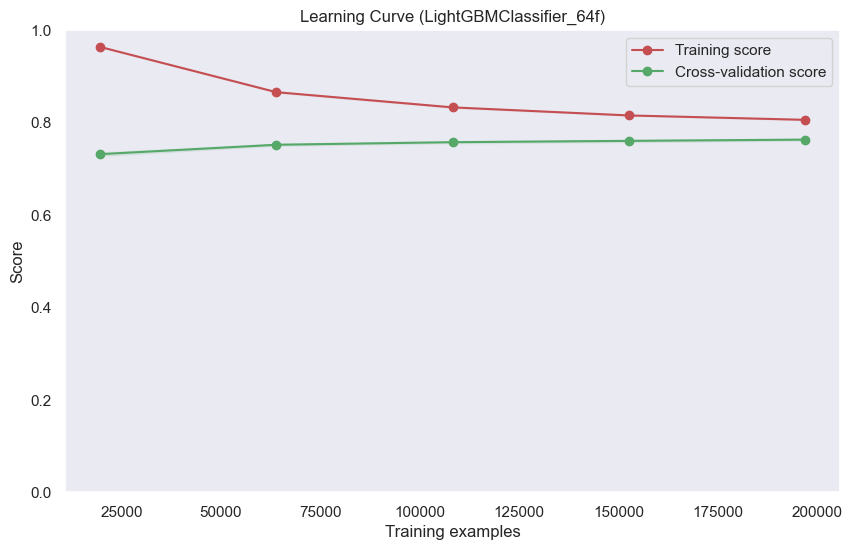

Prédictions pour les données de test:
            prediction
SK_ID_CURR            
384575        0.634152
214010        0.304043
142232        0.786526
389171        0.077189
283617        0.467938


NameError: name 'all_results' is not defined

In [231]:
# LightGBMClassifier 
lgb_clf = lgb.LGBMClassifier(random_state=42, class_weight='balanced', objective='binary')
param_grid_lgb = {'classifier__n_estimators': [50, 100, 500, 1000], 'classifier__learning_rate': [0.01, 0.02, 0.05, 0.1] }
results_lgb, test_results_lgb = new_evaluate_model(lgb_clf, 'LightGBMClassifier_64f', X_train, y_train, X_test, y_test, scoring, stratified_kfold, param_grid_lgb)
all_results.append(results_lgb)
gc.collect()

**meilleur modèle avec Test AUC de 0.77 et plus petit coût métier (129 591)**

## Récupérer un modèle et interprétation

In [148]:
# Tester le serving MLFlow
client = MlflowClient()
experiment_name = 'credit_risk_prediction'
experiment = client.get_experiment_by_name(experiment_name)

# Récupérer les runs
runs = client.search_runs(experiment_ids=[experiment.experiment_id], order_by=["start_time desc"])

# Afficher les informations des runs pour trouver celui d'hier
for run in runs:
    print(f"Run ID: {run.info.run_id}, Start Time: {run.info.start_time}, Status: {run.info.status}")

Run ID: 7f5eda77704a47c796b83fa28c52aacb, Start Time: 1719848706646, Status: FINISHED
Run ID: e7aed93e06664a448653378793ae139d, Start Time: 1719846953917, Status: FINISHED
Run ID: 2dd3687f4e904b70a6651ddb119ba9e1, Start Time: 1719837996316, Status: FINISHED
Run ID: 19e6d583b93b4b4186e1c7213047227d, Start Time: 1719556728349, Status: FINISHED


In [189]:
run_id = "7f5eda77704a47c796b83fa28c52aacb"

# Charger le modèle
model_uri = f"runs:/{run_id}/model"
loaded_pipeline = mlflow.sklearn.load_model(model_uri)
print(loaded_pipeline)

# Extraire le modèle de classification et le préprocessing du pipeline
loaded_model = loaded_pipeline.named_steps['classifier']
preprocessor = loaded_pipeline.named_steps['preprocessing']

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer()),
                                                                  ('standardscaler',
                                                                   StandardScaler(with_mean=False))]),
                                                  Index(['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN...
                                                  Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE',
       'DAYS_EMPLOYED_ANOM'],
 

In [190]:
# Fonction pour obtenir les noms des colonnes transformées
def get_feature_names(column_transformer):
    """
    Get feature names from all transformers.
    """
    output_features = []

    for name, transformer, columns in column_transformer.transformers_:
        if transformer == 'drop' or len(columns) == 0:
            continue

        if transformer == 'passthrough':
            output_features.extend(columns)
            continue

        if hasattr(transformer, 'named_steps'):
            # Access the named_steps attribute to get the final step in the pipeline
            transformer = transformer.named_steps[list(transformer.named_steps.keys())[-1]]

        if hasattr(transformer, 'get_feature_names_out'):
            # Get output feature names using get_feature_names_out method
            names = transformer.get_feature_names_out(columns)
        elif hasattr(transformer, 'get_feature_names'):
            # Get output feature names using get_feature_names method (for older versions of scikit-learn)
            names = transformer.get_feature_names(columns)
        else:
            names = columns

        output_features.extend(names)

    return output_features

In [194]:
column_names = get_feature_names(preprocessor)

In [193]:
# Préparer manuellement les données de test prétraitées
X_test_preprocessed = preprocessor.transform(X_test)
X_test_preprocessed_df = X_test_preprocessed_df.set_index('SK_ID_CURR')

# Création du explainer SHAP
explainer = shap.Explainer(loaded_model)

# Calcul des valeurs SHAP
shap_values = explainer.shap_values(X_test_preprocessed)

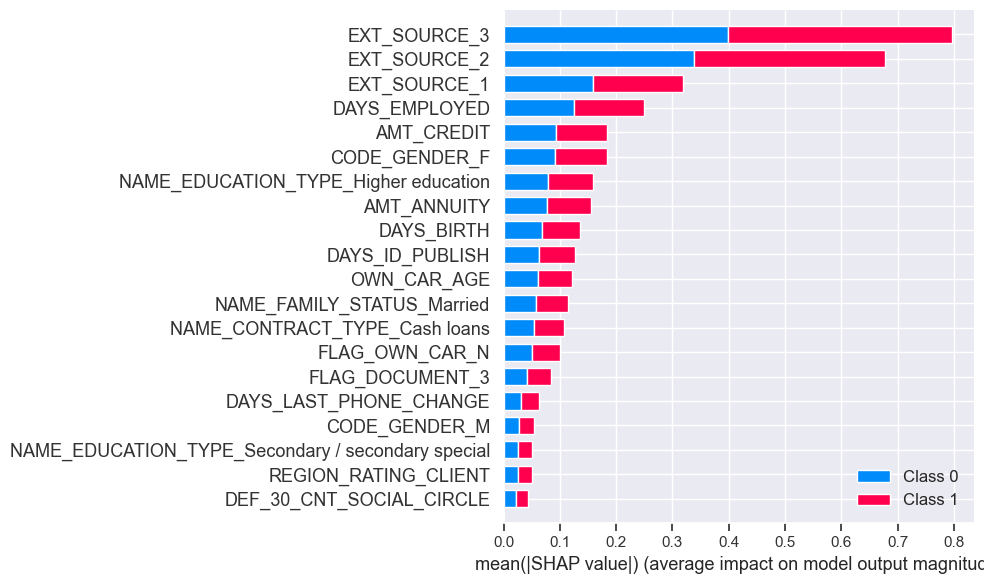

In [175]:
# Transformer en dataframe
X_test_preprocessed_df = pd.DataFrame(X_test_preprocessed, columns=column_names)
# Réassigner l'index de X_test à X_test_preprocessed_df
X_test_preprocessed_df.index = X_test.index

# Affichage des importances des caractéristiques globales
shap.summary_plot(shap_values, X_test_preprocessed_df, plot_type="bar", plot_size=(10,6), max_display=20, title="Feature importances (SHAP values)")

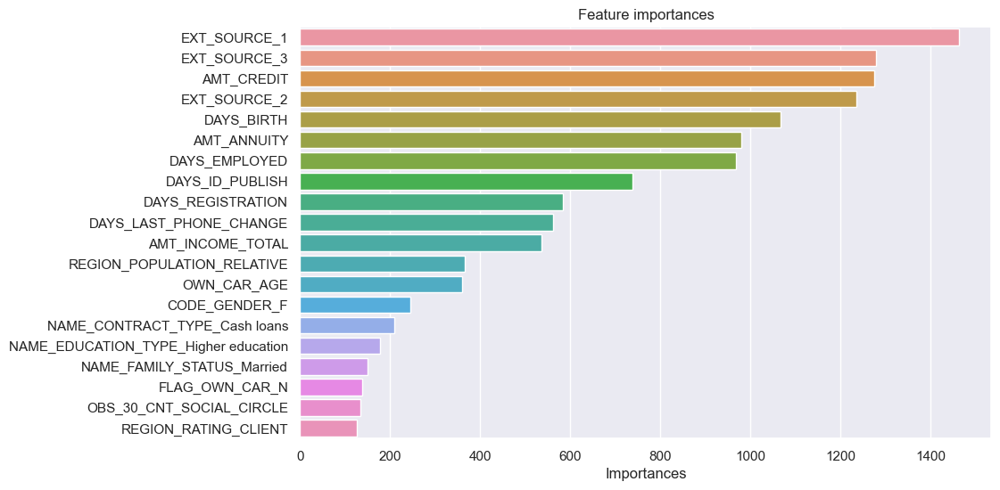

In [266]:
# Get feature importance 15 first values
values = sorted(zip(loaded_model.feature_importances_, column_names), reverse=True)[:20]

# Draw feature importances chart
rcParams['figure.figsize'] = 10, 6
plt.title("Feature importances")
sns.barplot(x=np.array(list(zip(*values))[0]), y=np.array(list(zip(*values))[1]))
plt.xlabel('Importances')
plt.show()

In [177]:
X_test_preprocessed_df.head()

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,CODE_GENDER_F,CODE_GENDER_M,CODE_GENDER_XNA,FLAG_OWN_CAR_N,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_N,FLAG_OWN_REALTY_Y,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade,ORGANIZATION_TYPE_Transport,ORGANIZATION_TYPE_University,DAYS_EMPLOYED_ANOM_False,DAYS_EMPLOYED_ANOM_True
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
384575,2.775221,1.980299,1.154701,3.627827,0.696911,-3.048889,-0.359706,-0.180895,-2.854055,2.731936,495.992944,2.601692,0.000000,23.047593,0.0,0.000000,4.401746,3.929244,4.850381,3.169519,0.003023,0.000000,0.0,0.000000,0.0,-0.002417,0.0,2.203536,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,

In [182]:
idx = 0  # Index de l'exemple

In [184]:
shap.force_plot(explainer.expected_value[1], shap_values[1][idx], X_test_preprocessed_df.iloc[idx])

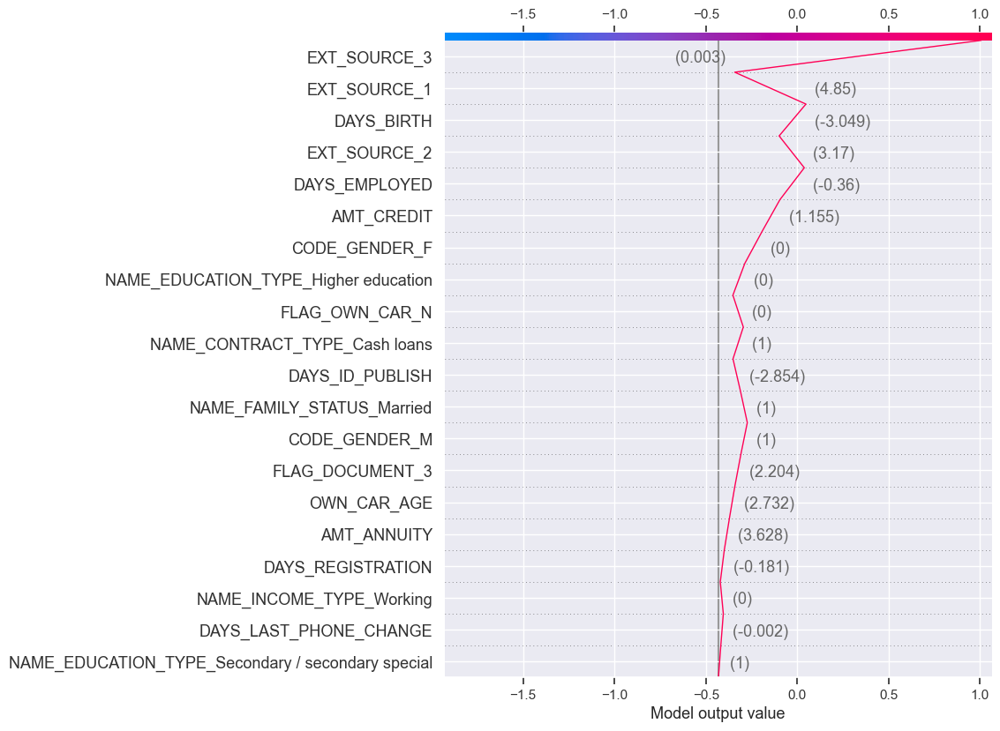

In [186]:
# Explication plus détaillée d'un exemple local
shap.decision_plot(explainer.expected_value[1], shap_values[1][idx], X_test_preprocessed_df.iloc[idx])

In [203]:
# Récupérer les infos de cette demande de prêt (la 1ère de X_test SK_ID_CURR=384575) et la prédiction
single_sample = X_test_preprocessed_df.loc[[384575]]
single_sample2 = X_test.loc[[384575]]

y_test_pred_idx = loaded_model.predict(single_sample)
y_test_proba_idx = loaded_model.predict_proba(single_sample)[:, 1]

X_test_pred_idx=single_sample2.copy()
X_test_pred_idx['Proba']=y_test_proba_idx
X_test_pred_idx['Prediction']=y_test_pred_idx

X_test_pred_idx

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,DAYS_EMPLOYED_ANOM,Proba,Prediction
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
384575,Cash loans,M,Y,N,2,207000.0,465457.5,52641.0,Commercial associate,Secondary / secondary special,Married,House / apartment,0.00963,-13297,-762.0,-637.0,-4307,19.0,1,1,0,1,0,0,Sales staff,4.0,2,Business Entity,0.675878,0.604894,0.000527,0.0,0.0,0.0,0.0,-2.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,0.732376,1


## Meilleur modèle et Interpretation 
Feature Importances

**L'importance des caractéristiques** est une approche analytique utilisée pour évaluer la contribution de chaque caractéristique à la performance d'un modèle de prédiction. En identifiant les variables les plus influentes, on peut comprendre mieux les dynamiques sous-jacentes des données et du modèle. Cette compréhension peut conduire à des améliorations significatives du modèle, notamment en termes de précision, d'efficacité et de simplification de l'explication des résultats.

In [208]:
# Séparation des variables numériques et catégorielles
num_features = X.select_dtypes(include=['float64', 'int64']).columns
cat_features = X.select_dtypes(include=['object', 'bool']).columns
print(len(num_features))
print(len(cat_features))

# Stratégie d'imputation des valeurs manquantes et normalisation et encoding
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# preprocessor selon type de variables
preprocessor = ColumnTransformer([
    ('num', num_pipeline, num_features),
    ('cat', cat_pipeline, cat_features)
])

# Application du preprocesseur sur les données d'entraînement et de test
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test) 

# Conversion en DataFrame (optionnel, mais recommandé pour une meilleure manipulation)
X_train_preprocessed_df = pd.DataFrame(X_train_preprocessed, columns=num_features.tolist() + preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(cat_features).tolist())
X_test_preprocessed_df = pd.DataFrame(X_test_preprocessed, columns=num_features.tolist() + preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(cat_features).tolist())

print(X_train_preprocessed_df.shape)
print(X_test_preprocessed_df.shape)

53
11
(246008, 141)
(61503, 141)


In [310]:
# Réassigner l'index de X_test à X_test_preprocessed_df
X_test_preprocessed_df.index = X_test.index

[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4798
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 130
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
AUROC on the train set: 0.7992301866944131
AUROC on the test set: 0.7674188345411488


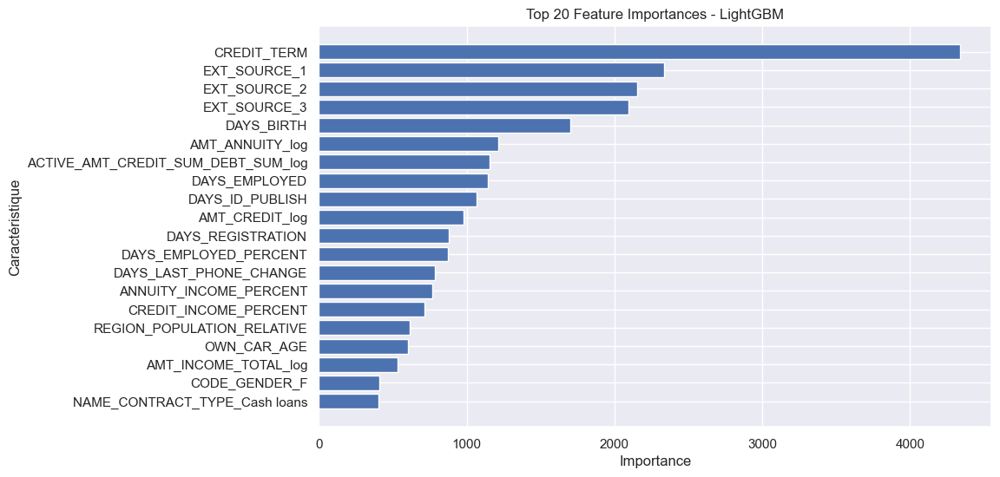

In [219]:
# Entraînement du modèle LightGBM avec les meilleurs hyperparamètres trouvés
bestmodel_lgbm = lgb.LGBMClassifier(random_state=42, class_weight='balanced', objective='binary', learning_rate=0.01, n_estimators=1000)
bestmodel_lgbm.fit(X_train_preprocessed, y_train)

# Prédictions probabilistes, la 2ème colonne est la probabilité d'être 1
pred_proba = bestmodel_lgbm.predict_proba(X_train_preprocessed)[:, 1]
train_auc = roc_auc_score(y_train, pred_proba)
print(f'AUROC on the train set: {train_auc}')

# Prédictions probabilistes sur Test Set
y_pred_proba = bestmodel_lgbm.predict_proba(X_test_preprocessed)[:, 1]
test_auc = roc_auc_score(y_test, y_pred_proba)
print(f'AUROC on the test set: {test_auc}')

# Obtenir les noms des colonnes après le prétraitement
feature_names = []

# Si vous utilisez ColumnTransformer pour le prétraitement
for name, transformer, columns in preprocessor.transformers_:
    if hasattr(transformer, 'get_feature_names_out'):
        feature_names.extend(transformer.get_feature_names_out(columns))
    else:
        feature_names.extend(columns)

# Récupération de l'importance des caractéristiques
feature_importances = pd.DataFrame({
    'feature': feature_names,
    'importance': bestmodel_lgbm.feature_importances_
})

# Tri des caractéristiques par importance décroissante
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# Affichage des 20 caractéristiques les plus importantes
#plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'][:20][::-1], feature_importances['importance'][:20][::-1])
plt.xlabel('Importance')
plt.ylabel('Caractéristique')
plt.title('Top 20 Feature Importances - LightGBM')
plt.show()

In [210]:
# Sauvegarde du preprocessing avec joblib
model_path = "C:\\Users\\gwenn\\Documents\\openclassrooms\\P7\\git\\OCP7creditscoring\\models\\preprocessor.pkl"
joblib.dump(preprocessor, model_path)

['C:\\Users\\gwenn\\Documents\\openclassrooms\\P7\\git\\OCP7creditscoring\\models\\preprocessor.pkl']

In [224]:
# Sauvegarde du modèle avec joblib
model_path = "C:\\Users\\gwenn\\Documents\\openclassrooms\\P7\\git\\OCP7creditscoring\\models\\best_model.pkl"
joblib.dump(bestmodel_lgbm, model_path)

print(f"Le modèle a été enregistré à {model_path}")

Le modèle a été enregistré à C:\Users\gwenn\Documents\openclassrooms\P7\git\OCP7creditscoring\Models\best_model.pkl


In [226]:
# Chargement du modèle à partir du fichier enregistré
best_model_loaded = joblib.load(model_path)
print("Le modèle a été chargé avec succès.")

Le modèle a été chargé avec succès.


In [419]:
# Sauvegarde de X_test
data_path = "C:\\Users\\gwenn\\Documents\\openclassrooms\\P7\\data\\test_data.csv"
X_test_preprocessed_df.to_csv(data_path, index=True)

In [421]:
# Chargement de X_test
X_test_preprocessed_df = pd.read_csv("C:\\Users\\gwenn\\Documents\\openclassrooms\\P7\\data\\test_data.csv")
X_test_preprocessed_df = X_test_preprocessed_df.set_index('SK_ID_CURR')

In [423]:
X_test_preprocessed_df.shape

(61503, 141)

X_test_preprocessed_df est trop volumineux pour pusher sur Github, je prends les 100 premières observations :

In [417]:
X_test_sample = X_test_preprocessed_df.head(1000)

In [425]:
# Sauvegarde de X_test_sample sur mon git
data_path = "C:\\Users\\gwenn\\Documents\\openclassrooms\\P7\\git\\OCP7creditscoring\\data\\test_data.csv"
X_test_sample.to_csv(data_path, index=True)

In [202]:
X_test_brut_sample = X_test.head(1000)

In [204]:
# Sauvegarde de X_test_sample sur mon git
data_path = "C:\\Users\\gwenn\\Documents\\openclassrooms\\P7\\git\\OCP7creditscoring\\data\\test_brut_data.csv"
X_test_brut_sample.to_csv(data_path, index=True)

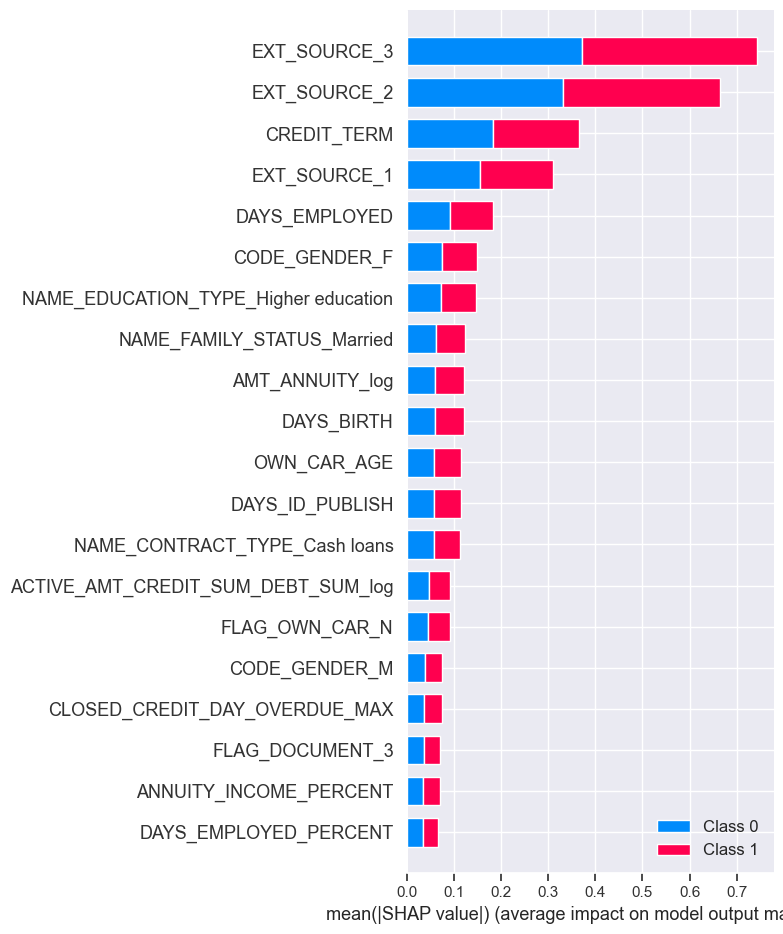

In [332]:
# Création du explainer SHAP
explainer = shap.Explainer(best_model_loaded)

# Calcule des valeurs SHAP
shap_values = explainer.shap_values(X_test_preprocessed_df)

# Affichage des importances des caractéristiques globales
shap.summary_plot(shap_values, X_test_preprocessed_df, plot_type="bar")

In [334]:
# Sauvegarde des valeurs SHAP 
shap_values_path = "C:\\Users\\gwenn\\Documents\\openclassrooms\\P7\\git\\OCP7creditscoring\\models\\shap_values.pkl"
joblib.dump(shap_values, shap_values_path)
print(f"Les valeurs SHAP ont été enregistrées à {shap_values_path}")

# Sauvegarde de l'explainer SHAP
explainer_path = "C:\\Users\\gwenn\\Documents\\openclassrooms\\P7\\git\\OCP7creditscoring\\models\\explainer.pkl"
joblib.dump(explainer, explainer_path)
print(f"L'explainer SHAP a été enregistré à {explainer_path}")

Les valeurs SHAP ont été enregistrées à C:\Users\gwenn\Documents\openclassrooms\P7\git\OCP7creditscoring\models\shap_values.pkl
L'explainer SHAP a été enregistré à C:\Users\gwenn\Documents\openclassrooms\P7\git\OCP7creditscoring\models\explainer.pkl


**Analyse de l’importance globale des variables** :

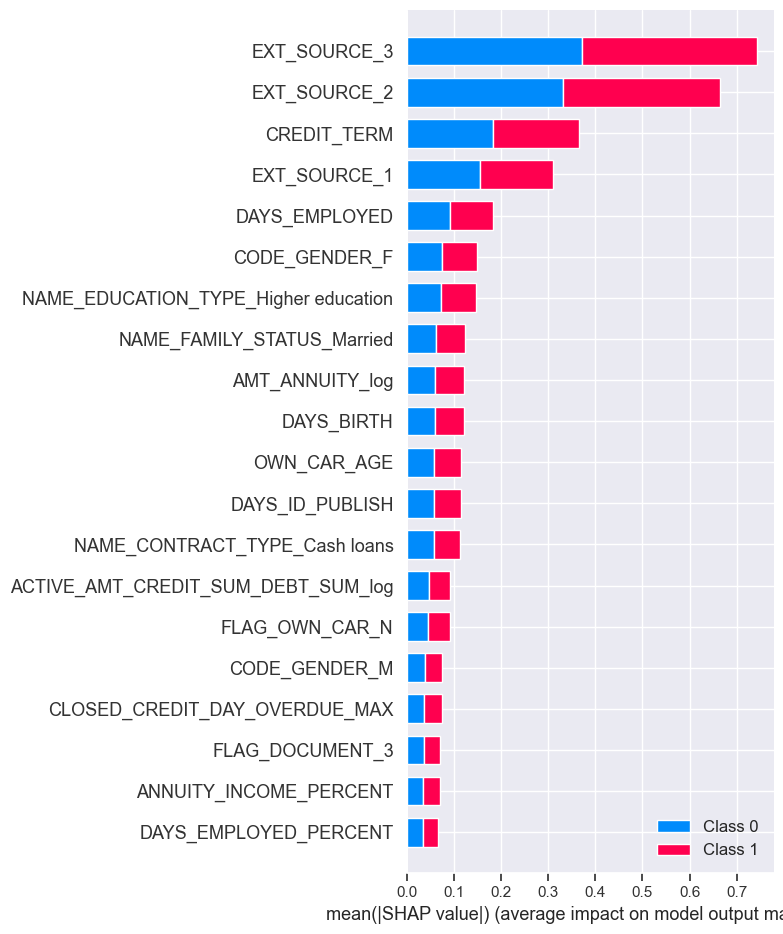

In [285]:
# Création du explainer SHAP
explainer = shap.Explainer(bestmodel_lgbm)

# Calcule des valeurs SHAP
shap_values = explainer.shap_values(X_test_preprocessed_df)

# Affichage des importances des caractéristiques globales avec shap.summary_plot
shap.summary_plot(shap_values, X_test_preprocessed_df, plot_type="bar")

Comme préssenti lors de l'analyse exploratoire, EXT_SOURCE_1, 2, 3 ainsi que l'âge du client (DAYS_BIRTH) ressortent dans le top 20 des caractéristiques les plus importantes. Le montant du crédit (AMT_CREDIT) et l'ancienneté dans l'emploi actuel (DAYS_EMPLOYED) aussi.    
Cela indique que la stabilité de l'emploi est un bon prédicteur de la capacité de remboursement.
Des caractéristiques personnelles comme le genre, le niveau d'éducation et la situation familiale contribuent de manière importante à la modélisation du risque. Ces facteurs soulignent les différences comportementales qui peuvent affecter la solvabilité. Attention à la discrimination !    
Les importances des caractéristiques ne sont pas la méthode la plus sophistiquée pour interpréter mais elles nous permettent de commencer à comprendre quels facteurs notre modèle prend en compte lorsqu'il fait des prédictions.  

3 des 4 variables "métier" créées et 1 variable de Crédit Bureau (ACTIVE_AMT_CREDIT_SUM_DEBT_SUM) figurent les 20 plus importantes.    

**Analyse de l’importance locale des variables** sur les individus du jeu de données :

In [360]:
# index 0 SK_ID_CURR 384575 y_test=0 y_test_pred=1 y_test_proba=0.64 Refusé
# index 1 SK_ID_CURR 214010 y_test=0 y_test_pred=0 y_test_proba=0.31 Accepté
index = 1  # Index de l'exemple

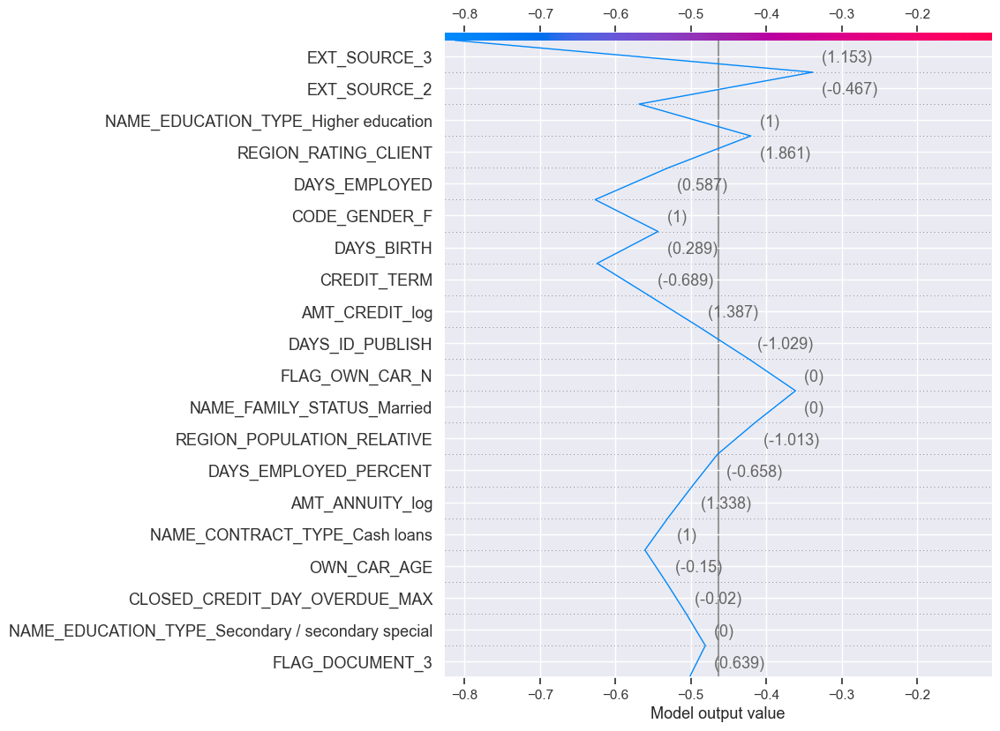

In [291]:
# Affichage de la valeur SHAP pour l'exemple local
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][index], X_test_preprocessed_df.iloc[index])

# Explication plus détaillée d'un exemple local
shap.decision_plot(explainer.expected_value[1], shap_values[1][index], X_test_preprocessed_df.iloc[index])

In [362]:
y_test_pred = bestmodel_lgbm.predict(X_test_preprocessed_df.iloc[index].values.reshape(1, -1))
print(y_test_pred)
# Prédiction de la probabilité de la classe positive pour l'échantillon unique
y_test_proba = bestmodel_lgbm.predict_proba(X_test_preprocessed_df.iloc[index].values.reshape(1, -1))[:, 1][0]
print(y_test_proba)

[0]
0.30732818741347373


In [364]:
y_test.iloc[index]

0

In [366]:
X_test.iloc[index]

NAME_CONTRACT_TYPE                              Cash loans
CODE_GENDER                                              F
FLAG_OWN_CAR                                             Y
FLAG_OWN_REALTY                                          Y
CNT_CHILDREN                                             0
NAME_INCOME_TYPE                      Commercial associate
NAME_EDUCATION_TYPE                       Higher education
NAME_FAMILY_STATUS                    Single / not married
NAME_HOUSING_TYPE                        House / apartment
REGION_POPULATION_RELATIVE                        0.006852
DAYS_BIRTH                                          -14778
DAYS_EMPLOYED                                      -1141.0
DAYS_REGISTRATION                                  -1610.0
DAYS_ID_PUBLISH                                      -4546
OWN_CAR_AGE                                           11.0
FLAG_MOBIL                                               1
FLAG_EMP_PHONE                                          

L'analyse SHAP locale détaillée de cette instance de prédiction révèle comment chaque caractéristique influence spécifiquement la décision du modèle de scoring de crédit.  

Les caractéristiques les plus influentes comprennent EXT_SOURCE_3 et EXT_SOURCE_2, qui exercent des impacts opposés significatifs, illustrant l'importance des évaluations de risque de sources externes.   
... à compléter !

 "NAME_CONTRACT_TYPE": "Cash loans",
  "CODE_GENDER": "F",
  "FLAG_OWN_CAR": "Y",
  "FLAG_OWN_REALTY": "Y",
  "CNT_CHILDREN": 0,
  "NAME_INCOME_TYPE": "Commercial associate",
  "NAME_EDUCATION_TYPE": "Higher education",
  "NAME_FAMILY_STATUS": "Single / not married",
  "NAME_HOUSING_TYPE": "House / apartment",
  "REGION_POPULATION_RELATIVE": 0.006852,
  "DAYS_BIRTH": -14778,
  "DAYS_EMPLOYED": -1141.0,
  "DAYS_REGISTRATION": -1610.0,
  "DAYS_ID_PUBLISH": -4546,
  "OWN_CAR_AGE": 11.0,
  "FLAG_MOBIL": 1,
  "FLAG_EMP_PHONE": 1,
  "FLAG_WORK_PHONE": 0,
  "FLAG_CONT_MOBILE": 1,
  "FLAG_PHONE": 0,
  "FLAG_EMAIL": 1,
  "OCCUPATION_TYPE": "Managers",
  "CNT_FAM_MEMBERS": 1.0,
  "REGION_RATING_CLIENT": 3,
  "ORGANIZATION_TYPE": "Business Entity",
  "EXT_SOURCE_1": 0.430827,
  "EXT_SOURCE_2": 0.425351,
  "EXT_SOURCE_3": 0.712155,
  "DAYS_LAST_PHONE_CHANGE": -1071.0,
  "FLAG_DOCUMENT_2": 0,
  "FLAG_DOCUMENT_3": 1,
  "FLAG_DOCUMENT_4": 0,
  "FLAG_DOCUMENT_5": 0,
  "FLAG_DOCUMENT_6": 0,
  "FLAG_DOCUMENT_7": 0,
  "FLAG_DOCUMENT_8": 0,
  "FLAG_DOCUMENT_9": 0,
  "FLAG_DOCUMENT_10": 0,
  "FLAG_DOCUMENT_11": 0,
  "FLAG_DOCUMENT_12": 0,
  "FLAG_DOCUMENT_13": 0,
  "FLAG_DOCUMENT_14": 0,
  "FLAG_DOCUMENT_15": 0,
  "FLAG_DOCUMENT_16": 0,
  "FLAG_DOCUMENT_17": 0,
  "FLAG_DOCUMENT_18": 0,
  "FLAG_DOCUMENT_19": 0,
  "FLAG_DOCUMENT_20": 0,
  "FLAG_DOCUMENT_21": 0,
  "DAYS_EMPLOYED_ANOM": false,
  "CREDIT_INCOME_PERCENT": 5.178636,
  "ANNUITY_INCOME_PERCENT": 0.197764,
  "CREDIT_TERM": 0.038188,
  "DAYS_EMPLOYED_ANOM": false,
  "CREDIT_INCOME_PERCENT": 5.178636,
  "ANNUITY_INCOME_PERCENT": 0.197764,
  "CREDIT_TERM": 0.038188,
  "DAYS_EMPLOYED_PERCENT": 0.077209,
  "ACTIVE_CREDIT_DAY_OVERDUE_MAX": 0.0,
  "CLOSED_CREDIT_DAY_OVERDUE_MAX": 0.0,
  "AMT_CREDIT_log": 14.063708,
  "AMT_ANNUITY_log": 10.798504,
  "AMT_INCOME_TOTAL_log": 12.41917,
  "OBS_30_CNT_SOCIAL_CIRCLE_log": 1.098612,
  "DEF_30_CNT_SOCIAL_CIRCLE_log": null,
  "OBS_60_CNT_SOCIAL_CIRCLE_log": 1.098612,
  "DEF_60_CNT_SOCIAL_CIRCLE_log": null,
  "ACTIVE_AMT_CREDIT_SUM_DEBT_SUM_log": null
  
 
\text{AMT_CREDIT} = \exp(14.063708) - 1 \approx 1262538.59
\text{AMT_ANNUITY} = \exp(10.798504) - 1 \approx 48558.15
\text{AMT_INCOME_TOTAL} = \exp(12.41917) - 1 \approx 247142.13
\text{OBS_30_CNT_SOCIAL_CIRCLE} = \exp(1.098612) - 1 \approx 2.0
\text{OBS_60_CNT_SOCIAL_CIRCLE} = \exp(1.098612) - 1 \approx 2.0

## Simplification du meilleur modèle


**La sélection de caractéristiques**, consiste à choisir un sous-ensemble de caractéristiques les plus pertinentes à partir d'un ensemble plus vaste, ce qui peut aider à réduire la dimensionnalité, à améliorer la performance du modèle, et à réduire les coûts de calcul et de stockage. En se basant sur les caractéristiques les plus importantes identifiées à partir du meilleur modèle, cette méthode cible non seulement l'optimisation des ressources mais favorise également l'élaboration de modèles plus robustes et généralisables, en évitant le surajustement et en renforçant la capacité du modèle à bien fonctionner sur de nouvelles données non vues.

In [200]:
#Sélection des 20 caractéristiques les plus importantes selon LightGBM
top_features = feature_importances['feature'][:20].tolist()
print(top_features)

['EXT_SOURCE_1', 'AMT_CREDIT', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'AMT_ANNUITY', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'DAYS_REGISTRATION', 'DAYS_LAST_PHONE_CHANGE', 'AMT_INCOME_TOTAL', 'REGION_POPULATION_RELATIVE', 'OWN_CAR_AGE', 'CODE_GENDER_F', 'NAME_CONTRACT_TYPE_Cash loans', 'NAME_EDUCATION_TYPE_Higher education', 'NAME_FAMILY_STATUS_Married', 'FLAG_OWN_CAR_N', 'FLAG_DOCUMENT_3', 'OBS_30_CNT_SOCIAL_CIRCLE']


In [210]:
#remaniement pour prendre les variables catégorielles 'CODE_GENDER', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'FLAG_OWN_CAR'
top_features2 = ['EXT_SOURCE_1', 'AMT_CREDIT', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'AMT_ANNUITY', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'DAYS_REGISTRATION', 
                 'DAYS_LAST_PHONE_CHANGE', 'AMT_INCOME_TOTAL', 'REGION_POPULATION_RELATIVE', 'OWN_CAR_AGE', 'CODE_GENDER', 'NAME_CONTRACT_TYPE', 
                 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'FLAG_OWN_CAR', 'FLAG_DOCUMENT_3', 'OBS_30_CNT_SOCIAL_CIRCLE']
print(top_features2)
# Filtrer les jeux de données avec les caractéristiques sélectionnées
X_train_selected = X_train[top_features2]
X_test_selected = X_test[top_features2]
print(X_train_selected.shape)

['EXT_SOURCE_1', 'AMT_CREDIT', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'AMT_ANNUITY', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'DAYS_REGISTRATION', 'DAYS_LAST_PHONE_CHANGE', 'AMT_INCOME_TOTAL', 'REGION_POPULATION_RELATIVE', 'OWN_CAR_AGE', 'CODE_GENDER', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'FLAG_OWN_CAR', 'FLAG_DOCUMENT_3', 'OBS_30_CNT_SOCIAL_CIRCLE']
(246008, 20)
            EXT_SOURCE_1  AMT_CREDIT  EXT_SOURCE_2  EXT_SOURCE_3  DAYS_BIRTH  \
SK_ID_CURR                                                                     
445388          0.236287    491823.0      0.224445         0.275        9192   

            AMT_ANNUITY  DAYS_EMPLOYED  DAYS_ID_PUBLISH  DAYS_REGISTRATION  \
SK_ID_CURR                                                                   
445388          26811.0         -155.0            -1863            -1511.0   

            DAYS_LAST_PHONE_CHANGE  AMT_INCOME_TOTAL  \
SK_ID_CURR                                             
445388        

In [212]:
# Séparation des variables numériques et catégorielles
num_features = X_train_selected.select_dtypes(include=['float64', 'int64']).columns
cat_features = X_train_selected.select_dtypes(include=['object', 'bool']).columns
print(len(num_features))
print(len(cat_features))

# Stratégie d'imputation des valeurs manquantes et normalisation et encoding
num_pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler(with_mean=False))
cat_pipeline = make_pipeline(SimpleImputer(strategy='most_frequent'), OneHotEncoder(handle_unknown='ignore')) 
                                                                                            #pour ignorer les catégories inconnues lors de la transformation
                                                                                          
# preprocessor selon type de variables
preprocessor = make_column_transformer((num_pipeline, num_features), (cat_pipeline, cat_features))

15
5


[LightGBM] [Info] Number of positive: 19876, number of negative: 226132
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2947
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 31
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Number of positive: 15901, number of negative: 180905
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2951
[LightGBM] [Info] Number of data points in the train set: 196806, number of used features: 31
[LightGBM] [Info

Successfully registered model 'LightGBMClassifier_20f'.
2024/06/28 08:46:12 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LightGBMClassifier_20f, version 1
Created version '1' of model 'LightGBMClassifier_20f'.


LightGBMClassifier_20f Results:
Train AUC: 0.7691952033693398
Test AUC: 0.7511678533282649
Optimal Threshold: 0.5
Optimal Business Cost: 132831
Training Time: 362.85023522377014


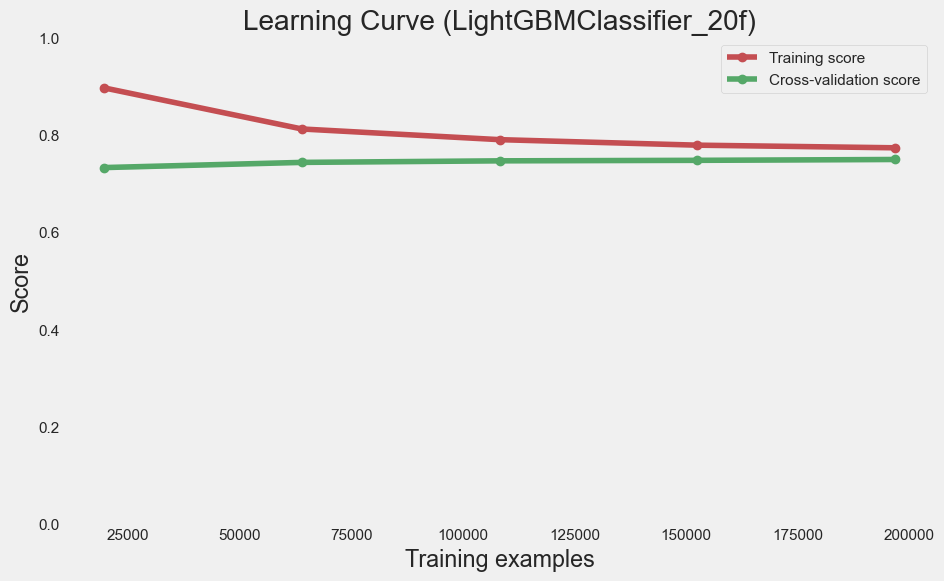

Prédictions pour les données de test:
            prediction
SK_ID_CURR            
384575        0.713978
214010        0.299791
142232        0.698868
389171        0.215931
283617        0.460312


41938

In [214]:
# Relancer la modélisation avec seulement les 20 variables les plus importantes et ajustement des hyperparamètres
lgb_clf = lgb.LGBMClassifier(random_state=42, class_weight='balanced', objective='binary', learning_rate=0.01, n_estimators=1000)
param_grid_lgb = { 'classifier__n_estimators': [50, 100, 200, 500, 1000], 'classifier__learning_rate': [0.01, 0.02, 0.05] }

tag = "Feature selection"
results_lgbm_featselect, test_results_lgbm_featselect = new_evaluate_model(lgb_clf, 'LightGBMClassifier_20f', X_train_selected, y_train, X_test_selected, y_test, scoring, 
                                                                           stratified_kfold, param_grid_lgb, tag)
all_results.append(results_lgbm_featselect)
gc.collect()

# Meilleur modèle  
tester MLflow Serving préparation pour mise en production

In [296]:
joblib.dump(bestmodel_lgbm, 'bestmodel_lgbm_64f.joblib')

['bestmodel_lgbm_64f.joblib']

In [ ]:
# MlflowClient() est utilisé pour interagir avec le registre de modèles et changer le stade du modèle
model_alias = "Production"
tag = "Best Model"
client = MlflowClient()
# transitionne la première version du modèle vers le stade "Production".
client.transition_model_version_stage(name=model_name, version=1, stage="Production")
client.set_model_version_tag(name=model_name, version=registered_model.version, key='choix', value=model_alias)
print(f"Modèle enregistré : {model_name} version {registered_model.version} avec l'information '{model_alias}'.")

# Conclusions

Dans ce notebook, nous avons d'abord pris soin de comprendre les données, notre tâche et les métriques selon lesquelles nos soumissions seront jugées. Ensuite, nous avons effectué une analyse exploratoire des données (EDA) assez simple pour essayer d'identifier des relations, des tendances ou des anomalies qui pourraient aider notre modélisation. En cours de route, nous avons effectué les étapes de prétraitement nécessaires telles que l'encodage des variables catégorielles, l'imputation des valeurs manquantes et la mise à l'échelle des caractéristiques. Puis, nous avons construit de nouvelles caractéristiques à partir des données existantes pour voir si cela pouvait aider notre modèle.

Une fois l'exploration des données, la préparation des données et l'ingénierie des caractéristiques terminées, nous avons mis en œuvre un modèle de base sur lequel nous espérons nous améliorer. Ensuite, nous avons construit un deuxième modèle légèrement plus complexe pour battre notre premier score. Nous avons également mené une expérience pour déterminer l'effet de l'ajout des variables d'ingénierie.

Nous avons suivi les grandes lignes d'un projet de machine learning :
Comprendre le problème et les données
Nettoyage et formatage des données (cela a été principalement fait pour nous)
Analyse exploratoire des données (EDA)
Modèle de base
Modèle amélioré
Interprétation du modèle 

Dans ce notebook d’entraînement des modèles, un tracking d'expérimentations à l’aide de MLFlow a été généré ainsi qu'un stockage centralisé des modèles dans un “model registry”

# Etapes suivantes   
pour élaborer une plateforme MLOps avec des outils Open Source :  
 ● MLFlow pour la gestion “d’expériences” et leur tracking lors de la phase d’entraînement des modèles, ainsi que la visualisation des
 résultats avec MLFlow UI  
 ● MLFlowpour le stockage centralisé des modèles dans un “model registry” et le serving  
 ● Git, logiciel de version de code, pour suivre les modifications du code final de l’API de prédiction à déployer  
 ● Github pour stocker et partager sur le cloud le code de l’API, alimenté par un “push” Git et ainsi assurer une intégration continue  
 ● Github Actions pour le déploiement continu et automatisé du code de l’API sur le cloud  
 ● Pytest pour concevoir les tests unitaires et les exécuter de manière automatisée lors du build réalisé par Github Actions

- Gérer le code avec le logiciel de version **Git**
- Partager le code sur Github pour assurer une intégration continue
- Utiliser **Github Actions** pour le déploiement continu et automatisé du code de l’API sur le cloud / utiliser le **Cloud Azure** webapp ASP F1 gratuit 
- Concevoir des tests unitaires avec **Pytest** et les exécuter de manière automatisée lors du build réalisé par Github Actions
- déployer le modèle de machine learning sous forme d'API en production avec **FastAPI**
- réaliser en local une interface de test de cette API (via un notebook ou l'application **Streamlit**) Streamlit est un outil qui permet de réaliser des tableaux de bord (dashboards)
- simuler l'analyse de la dérive des données (**data drift**), est-ce que le modèle capture toujours les motifs des nouvelles données entrantes aussi efficacement qu'il l'a fait lors de la phase de conception ?
si les performances du modèle se dégradent avec le temps, nous devons déclencher automatiquement le pipeline d'apprentissage (apprentissage continu)  

In [307]:
# installer la bibliothèque Streamlit
#pip install streamlit

  Obtaining dependency information for streamlit from https://files.pythonhosted.org/packages/c6/51/f140402202af6ce1bf747243f66415c5eb2f43ba2e2ac419a7e855d20673/streamlit-1.36.0-py2.py3-none-any.whl.metadata
  Obtaining dependency information for altair<6,>=4.0 from https://files.pythonhosted.org/packages/46/30/2118537233fa72c1d91a81f5908a7e843a6601ccc68b76838ebc4951505f/altair-5.3.0-py3-none-any.whl.metadata
  Obtaining dependency information for blinker<2,>=1.0.0 from https://files.pythonhosted.org/packages/bb/2a/10164ed1f31196a2f7f3799368a821765c62851ead0e630ab52b8e14b4d0/blinker-1.8.2-py3-none-any.whl.metadata
  Obtaining dependency information for pydeck<1,>=0.8.0b4 from https://files.pythonhosted.org/packages/ab/4c/b888e6cf58bd9db9c93f40d1c6be8283ff49d88919231afe93a6bcf61626/pydeck-0.9.1-py2.py3-none-any.whl.metadata
   ---------------------------------------- 0.0/8.6 MB ? eta -:--:--
    --------------------------------------- 0.2/8.6 MB 3.9 MB/s eta 0:00:03
   ---- ------------

Avec la console, depuis le répertoire racine, lancer Streamlit avec la commande suivante :
streamlit run dashboard.py

In [313]:
# installer la bibliothèque FastAPI avec un serveur ASGI
#pip install fastapi uvicorn

  Obtaining dependency information for fastapi from https://files.pythonhosted.org/packages/e6/33/de41e554e5a187d583906e10d53bfae5fd6c07e98cbf4fe5262bd37e739a/fastapi-0.111.0-py3-none-any.whl.metadata
  Obtaining dependency information for uvicorn from https://files.pythonhosted.org/packages/b2/f9/e6f30ba6094733e4f9794fd098ca0543a19b07ac1fa3075d595bf0f1fb60/uvicorn-0.30.1-py3-none-any.whl.metadata
  Obtaining dependency information for starlette<0.38.0,>=0.37.2 from https://files.pythonhosted.org/packages/fd/18/31fa32ed6c68ba66220204ef0be798c349d0a20c1901f9d4a794e08c76d8/starlette-0.37.2-py3-none-any.whl.metadata
  Obtaining dependency information for typing-extensions>=4.8.0 from https://files.pythonhosted.org/packages/26/9f/ad63fc0248c5379346306f8668cda6e2e2e9c95e01216d2b8ffd9ff037d0/typing_extensions-4.12.2-py3-none-any.whl.metadata
  Obtaining dependency information for fastapi-cli>=0.0.2 from https://files.pythonhosted.org/packages/a1/03/89bf615052aa5453c04d952225ded0b88aab6487b9c

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
quartodoc 0.7.2 requires watchdog>=3.0.0, but you have watchdog 2.1.6 which is incompatible.
skimpy 0.0.14 requires pyarrow<16,>=13, but you have pyarrow 11.0.0 which is incompatible.
spacy 3.7.2 requires typer<0.10.0,>=0.3.0, but you have typer 0.12.3 which is incompatible.
weasel 0.3.4 requires typer<0.10.0,>=0.3.0, but you have typer 0.12.3 which is incompatible.


In [ ]:
# Versions des différences librairies
print("Numpy version:", np.__version__)
print("Pandas version:", pd.__version__)

**Mission 2 Intégrez et optimisez le système MLOps**

# Data drift
Définir et mettre en œuvre une stratégie de suivi de la performance d’un modèle en production et en assurer la maintenance afin de garantir dans le temps la production de prédictions performantes.  
CE1 Vous avez défini une stratégie de suivi de la performance du modèle. Dans le cadre du projet : choix de réaliser a priori cette analyse sur le dataset disponible : analyse de data drift entre application_train et application_test.  
CE2 Vous avez réalisé un système de stockage d’événements relatifs aux prédictions réalisées par l’API et une gestion d’alerte en cas de dégradation significative de la performance. Dans le cadre du projet : choix de réaliser a priori cette analyse analyse de data drift, via une simulation dans un notebook et création d’un tableau HTML d’analyse avec la librairie evidently.   
CE3 Vous avez analysé la stabilité du modèle dans le temps et défini des actions d’amélioration de sa performance. Dans le cadre de ce projet : analyse du tableau HTML evidently, et conclusion sur un éventuel data drift.  

Evidently est un système de surveillance de modèle ML open source. Il permet d'analyser les modèles d'apprentissage automatique pendant le développement, la validation ou le suivi de la production. L'outil génère des rapports interactifs à partir de pandas DataFrame.

In [337]:
#pip install evidently

     ---------------------------------------- 0.0/125.2 kB ? eta -:--:--
     -------------------------------------- 125.2/125.2 kB 7.2 MB/s eta 0:00:00
     ---------------------------------------- 0.0/102.0 kB ? eta -:--:--
     -------------------------------------- 102.0/102.0 kB 5.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/3.4 MB ? eta -:--:--
   ---------------------------------------  3.4/3.4 MB 73.0 MB/s eta 0:00:01
   ---------------------------------------- 3.4/3.4 MB 54.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/230.8 kB ? eta -:--:--
   --------------------------------------- 230.8/230.8 kB 14.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/177.6 kB ? eta -:--:--
   ---------------------------------------- 177.6/177.6 kB ? eta 0:00:00
   ---------------------------------------- 0.0/530.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/530.1 kB ? eta -:--:--
   -------------------------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
botocore 1.29.76 requires urllib3<1.27,>=1.25.4, but you have urllib3 2.2.2 which is incompatible.
conda-repo-cli 1.0.75 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.
s3fs 2023.4.0 requires fsspec==2023.4.0, but you have fsspec 2024.6.1 which is incompatible.


In [340]:
# Data drift
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset

In [400]:
# Load data
app_train = pd.read_csv('data/application_train.csv')
app_test = pd.read_csv('data/application_test.csv')

sur les 120 colonnes (enlever SK_ID_CURR) ou les 57 sélectionnés pour ma modélisation ?

In [403]:
# Create evidently report
data_drift_report = Report(metrics=[DataDriftPreset()])
data_drift_report.run(reference_data=app_train.drop(columns='TARGET'), current_data=app_test, column_mapping=None)
data_drift_report

In [409]:
# Save report
data_drift_report.save_html('evidently/data_drift_report.html')